# Harnessing Machine Learning for Early Detection of Breast Cancer

### Importing Required Packages

In [4]:
!pip3 install -U ucimlrepo 
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoderfrom sklearn.tree import plot_tree
from scipy.stats import mstats
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, roc_curve, auc
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.linear_model import Perceptron
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.decomposition import PCA



### Loading Breast Cancer Dataset

In [5]:
from ucimlrepo import fetch_ucirepo 
  
# fetch dataset 
breast_cancer_wisconsin_diagnostic = fetch_ucirepo(id=17) 
  
 
X = breast_cancer_wisconsin_diagnostic.data.features 
y = breast_cancer_wisconsin_diagnostic.data.targets 
  


### Dataset Overview And Preprocessing

In [6]:
Breast_df = pd.concat([X, y], axis=1)
Breast_df.head()

,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,symmetry1,fractal_dimension1,...,texture3,perimeter3,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3,Diagnosis
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,M
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,M
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,M
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,M
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,M


In [7]:
Breast_df.tail()

,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,symmetry1,fractal_dimension1,...,texture3,perimeter3,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3,Diagnosis
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,M
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,M
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,M
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,M
568,7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,0.1587,0.05884,...,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.0000,0.2871,0.07039,B


In [8]:
Breast_df.shape

(569, 31)

In [9]:
Breast_df.describe()

,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,symmetry1,fractal_dimension1,...,radius3,texture3,perimeter3,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [10]:
Breast_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   radius1             569 non-null    float64
 1   texture1            569 non-null    float64
 2   perimeter1          569 non-null    float64
 3   area1               569 non-null    float64
 4   smoothness1         569 non-null    float64
 5   compactness1        569 non-null    float64
 6   concavity1          569 non-null    float64
 7   concave_points1     569 non-null    float64
 8   symmetry1           569 non-null    float64
 9   fractal_dimension1  569 non-null    float64
 10  radius2             569 non-null    float64
 11  texture2            569 non-null    float64
 12  perimeter2          569 non-null    float64
 13  area2               569 non-null    float64
 14  smoothness2         569 non-null    float64
 15  compactness2        569 non-null    float64
 16  concavit

In [11]:
#Encoding Categorical variable
# Initialize the label encoder
le = LabelEncoder()

# Encode the 'Diagnosis' column
Breast_df['Diagnosis'] = le.fit_transform(Breast_df['Diagnosis'])

print(Breast_df['Diagnosis'].value_counts())


Diagnosis
0    357
1    212
Name: count, dtype: int64


In [12]:
#Checking for the availability of the missing values
print(Breast_df.isnull().sum())

radius1               0
texture1              0
perimeter1            0
area1                 0
smoothness1           0
compactness1          0
concavity1            0
concave_points1       0
symmetry1             0
fractal_dimension1    0
radius2               0
texture2              0
perimeter2            0
area2                 0
smoothness2           0
compactness2          0
concavity2            0
concave_points2       0
symmetry2             0
fractal_dimension2    0
radius3               0
texture3              0
perimeter3            0
area3                 0
smoothness3           0
compactness3          0
concavity3            0
concave_points3       0
symmetry3             0
fractal_dimension3    0
Diagnosis             0
dtype: int64


In [13]:
Breast_df.duplicated().any()

False

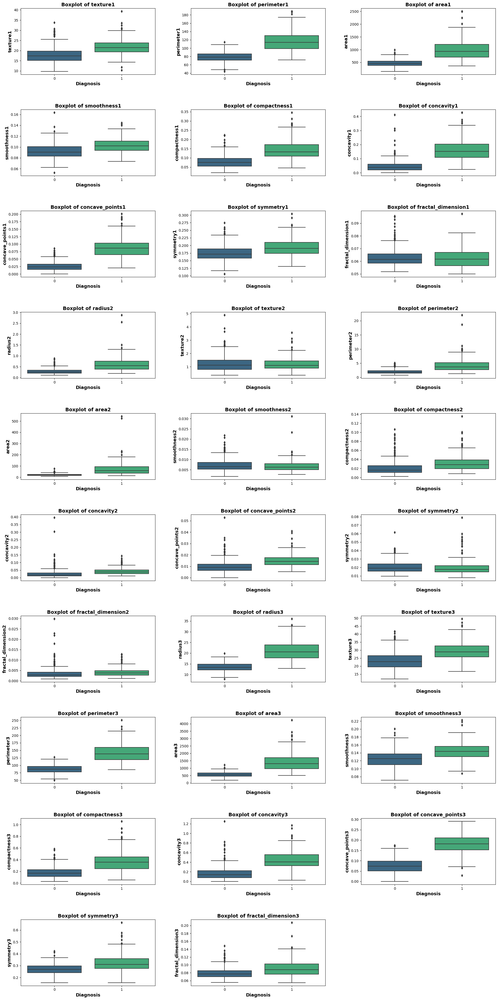

In [14]:
# Detecting Outliers
Breast_df['Diagnosis'] = Breast_df['Diagnosis'].astype('category')

# Set up the matplotlib figure
plt.figure(figsize=(20, 40))

# Independent variables (all columns except 'Diagnosis')
independent_vars = Breast_df.columns[1:]  

# Create a boxplot for each variable to check for outliers
for i, col in enumerate(independent_vars):
    
    # Check if the current column (col) is numeric
    if pd.api.types.is_numeric_dtype(Breast_df[col]):
        plt.subplot(10, 3, i + 1)  # Adjust the grid size as needed
        sns.boxplot(x='Diagnosis', y=col, data=Breast_df, palette='viridis')
        plt.xlabel('Diagnosis', fontsize=13, fontweight='bold')
        plt.ylabel(col, fontsize=13, fontweight='bold')
        plt.title(f'Boxplot of {col}', fontsize=14, fontweight='bold')

plt.tight_layout(w_pad=5, h_pad=5)
plt.show()


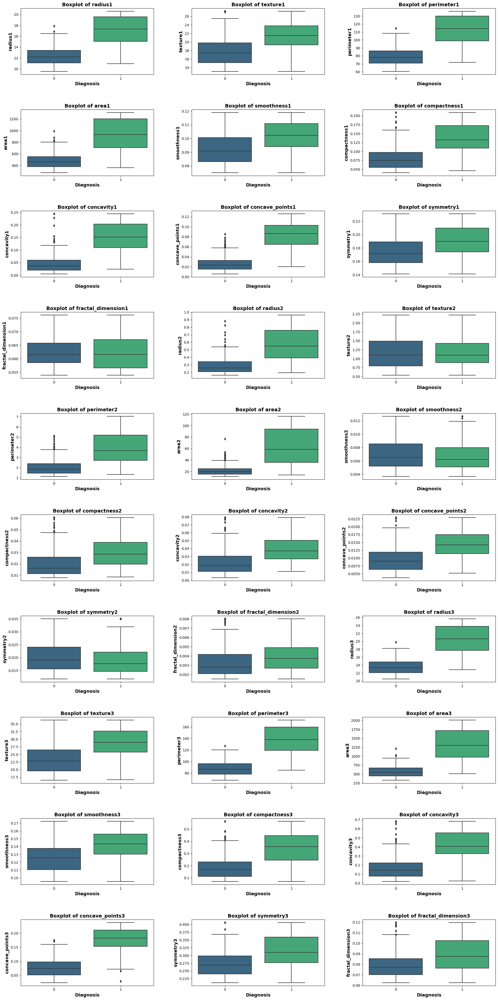

In [15]:
#Handling Outliers
# Handling Outliers using Winsorization
Breast_df_winsorized = Breast_df.copy()

# Select only numeric columns (excluding 'Diagnosis')
numeric_columns = Breast_df_winsorized.select_dtypes(include=[np.number]).columns

for col in numeric_columns:  # Only iterate over numeric columns
    Breast_df_winsorized[col] = mstats.winsorize(Breast_df_winsorized[col], limits=[0.05, 0.05])  # Limit at 5%

# Set up the matplotlib figure
plt.figure(figsize=(20, 40))

# Create a boxplot for each numeric variable to check for outliers
for i, col in enumerate(numeric_columns):
    plt.subplot(10, 3, i + 1)  # Adjust the grid size as needed
    sns.boxplot(x='Diagnosis', y=col, data=Breast_df_winsorized, palette='viridis')
    plt.xlabel('Diagnosis', fontsize=13, fontweight='bold')
    plt.ylabel(col, fontsize=13, fontweight='bold')
    plt.title(f'Boxplot of {col}', fontsize=14, fontweight='bold')

# Adjust layout for better spacing
plt.tight_layout(w_pad=5, h_pad=5)
plt.show()

### Data Splitting Using Stratified Random Sampling

In [16]:
X = Breast_df_winsorized.drop('Diagnosis', axis=1)  # Features
y = Breast_df_winsorized['Diagnosis']  # Target variable

# Perform stratified split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, stratify=y, random_state=42)

# Display the shapes of the resulting datasets
print(f"Training data shape: {X_train.shape}, Training target shape: {y_train.shape}")
print(f"Testing data shape: {X_test.shape}, Testing target shape: {y_test.shape}")

Training data shape: (341, 30), Training target shape: (341,)
Testing data shape: (228, 30), Testing target shape: (228,)


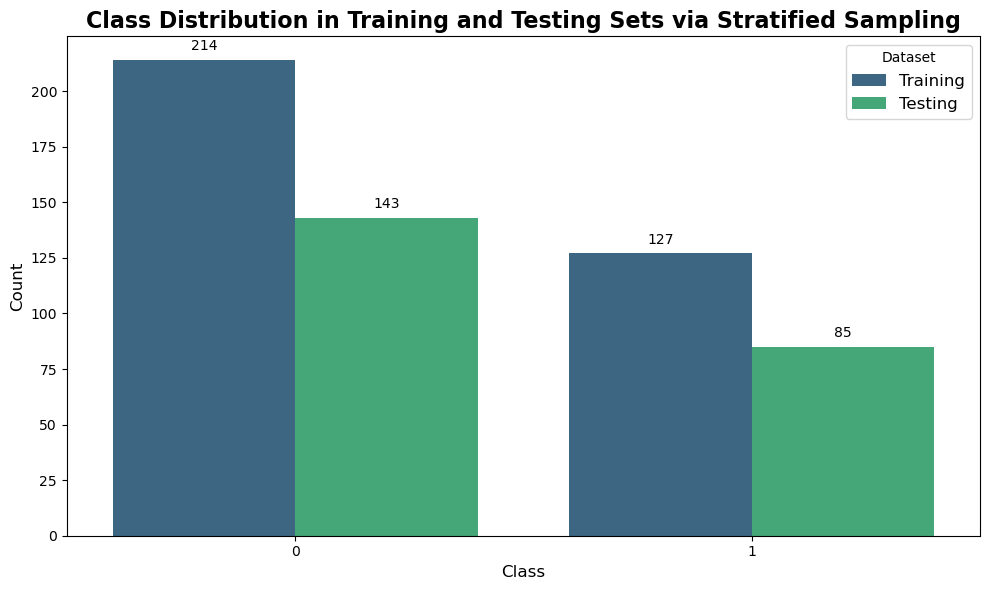

In [64]:
# Count the occurrences of each class in the training and testing sets
train_counts = y_train.value_counts()
test_counts = y_test.value_counts()

# Create a DataFrame for visualization
data = pd.DataFrame({
    'Class': train_counts.index.tolist() + test_counts.index.tolist(),
    'Count': train_counts.tolist() + test_counts.tolist(),
    'Set': ['Training'] * len(train_counts) + ['Testing'] * len(test_counts)
})


viridis_palette = sns.color_palette("viridis", len(data['Set'].unique()))


plt.figure(figsize=(10, 6))
bar_plot = sns.barplot(x='Class', y='Count', hue='Set', data=data, palette=viridis_palette)

# Add titles and labels
plt.title('Class Distribution in Training and Testing Sets via Stratified Sampling', fontsize=16, fontweight='bold')
plt.xlabel('Class', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=0)
plt.legend(title='Dataset', fontsize=12)


for p in bar_plot.patches:
    bar_plot.annotate(format(int(p.get_height()), ','),
                      (p.get_x() + p.get_width() / 2., p.get_height()),
                      ha='center', va='bottom', fontsize=10,
                      color='black', xytext=(0, 5),  
                      textcoords='offset points')


plt.tight_layout()
plt.show()




### Feature Scaling Using Standardization

In [17]:
# Standardization
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=X_test.columns)
y_train_df = pd.Series(y_train).reset_index(drop=True)
y_test_df = pd.Series(y_test).reset_index(drop=True)

X_train_scaled_df['Diagnosis'] = y_train_df

X_test_scaled_df['Diagnosis'] = y_test_df

# Check the mean and standard deviation of the standardized training data:
print("Mean of each feature after standardization (Training data):")
print(X_train_scaled_df.drop('Diagnosis', axis=1).mean())
print("\nStandard deviation of each feature after standardization (Training data):")
print(X_train_scaled_df.drop('Diagnosis', axis=1).std())

# Check the mean and standard deviation of the standardized training data:
print("\nMean of each feature after standardization (Testing data):")
print(X_test_scaled_df.drop('Diagnosis', axis=1).mean())
print("\nStandard deviation of each feature after standardization (Testing data):")
print(X_test_scaled_df.drop('Diagnosis', axis=1).std())


Mean of each feature after standardization (Training data):
radius1              -2.187888e-16
texture1             -1.172083e-16
perimeter1            4.401823e-16
area1                 8.530159e-17
smoothness1           1.000177e-15
compactness1         -2.734860e-16
concavity1            1.627893e-17
concave_points1      -1.302314e-17
symmetry1             6.251109e-17
fractal_dimension1   -5.222281e-16
radius2              -2.969277e-16
texture2              2.083703e-17
perimeter2           -5.209258e-17
area2                 7.292961e-17
smoothness2           1.953472e-17
compactness2         -2.630675e-16
concavity2            1.478127e-16
concave_points2      -2.161842e-16
symmetry2            -1.041852e-16
fractal_dimension2   -1.771148e-16
radius3               2.226958e-16
texture3              2.031610e-16
perimeter3           -4.492985e-16
area3                 3.568341e-16
smoothness3           2.122772e-16
compactness3         -4.688332e-17
concavity3            1.041852

### Exploratory Data Analysis On Training Data

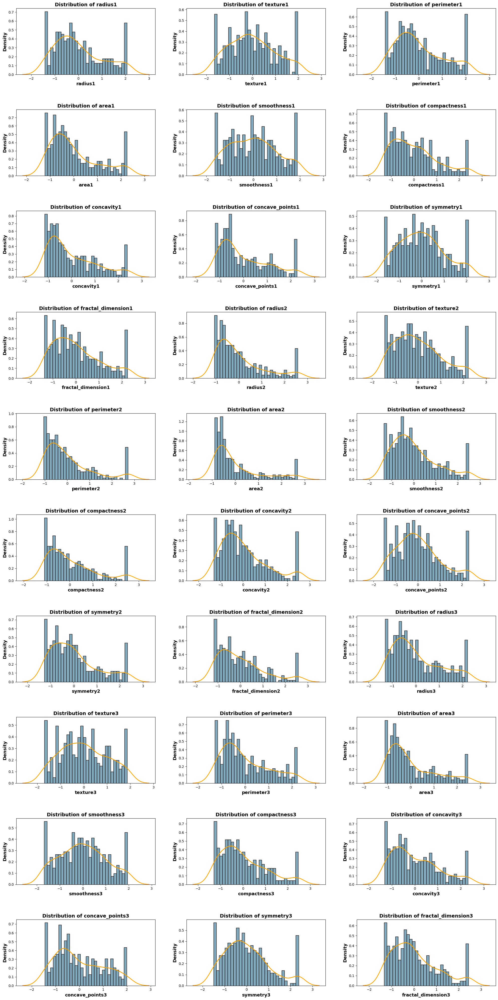

In [18]:
# Set up the matplotlib figure
plt.figure(figsize=(20, 40))

independent_vars = X_train_scaled_df.columns[:-1] 

# Create a histogram with KDE for each variable
for i, col in enumerate(independent_vars):
    plt.subplot(10, 3, i + 1)  
    # Plot histogram with KDE
    sns.histplot(X_train_scaled_df[col], bins=30, color='#2D708E', kde=True, stat="density", alpha=0.6)
    sns.kdeplot(X_train_scaled_df[col], color='orange', linewidth=2)
    
    
    plt.xlabel(col, fontsize=13, fontweight='bold')
    plt.ylabel('Density', fontsize=13, fontweight='bold')
    plt.title(f'Distribution of {col}', fontsize=14, fontweight='bold')


plt.tight_layout(w_pad=5, h_pad=5)
plt.show()


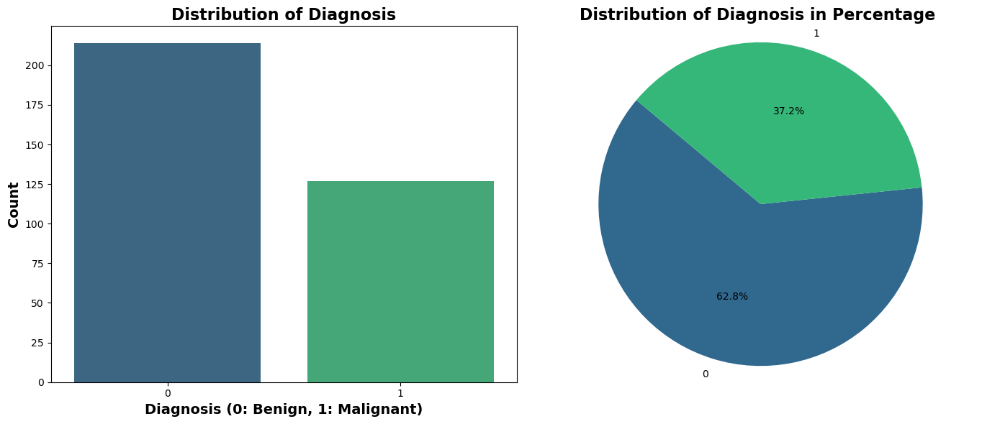

In [19]:
y_train_df = pd.DataFrame(y_train, columns=['Diagnosis'])
train_data = pd.concat([pd.DataFrame(X_train_scaled, columns=X_train.columns), y_train_df], axis=1)
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)  
sns.countplot(data=train_data, x='Diagnosis', palette='viridis')
plt.title('Distribution of Diagnosis', fontsize=16, fontweight='bold')
plt.xlabel('Diagnosis (0: Benign, 1: Malignant)', fontsize=14, fontweight='bold')
plt.ylabel('Count', fontsize=14, fontweight='bold')

diagnosis_counts = train_data['Diagnosis'].value_counts()

plt.subplot(1, 2, 2)  
plt.pie(diagnosis_counts, labels=diagnosis_counts.index, autopct='%1.1f%%', startangle=140, 
        colors=sns.color_palette('viridis', len(diagnosis_counts)))
plt.title('Distribution of Diagnosis in Percentage ', fontsize=16, fontweight='bold')
plt.axis('equal')  

plt.tight_layout()
plt.show()



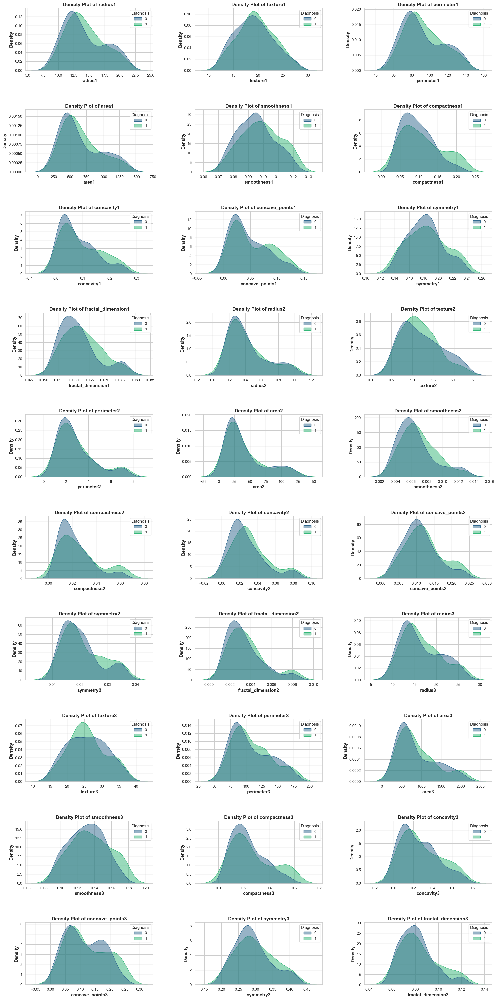

In [66]:
sns.set(style="whitegrid")
plt.figure(figsize=(20, 40))
independent_vars = X_train.columns  
# Create a density plot for each variable
for i, col in enumerate(independent_vars):
    plt.subplot(10, 3, i + 1)  
    sns.kdeplot(data=train_data, x=col, hue='Diagnosis', fill=True, palette='viridis', common_norm=False, alpha=0.5)
    
    # Add labels and title
    plt.xlabel(col, fontsize=13, fontweight='bold')
    plt.ylabel('Density', fontsize=13, fontweight='bold')
    plt.title(f'Density Plot of {col}', fontsize=14, fontweight='bold')


plt.tight_layout(w_pad=5, h_pad=5)
plt.show()


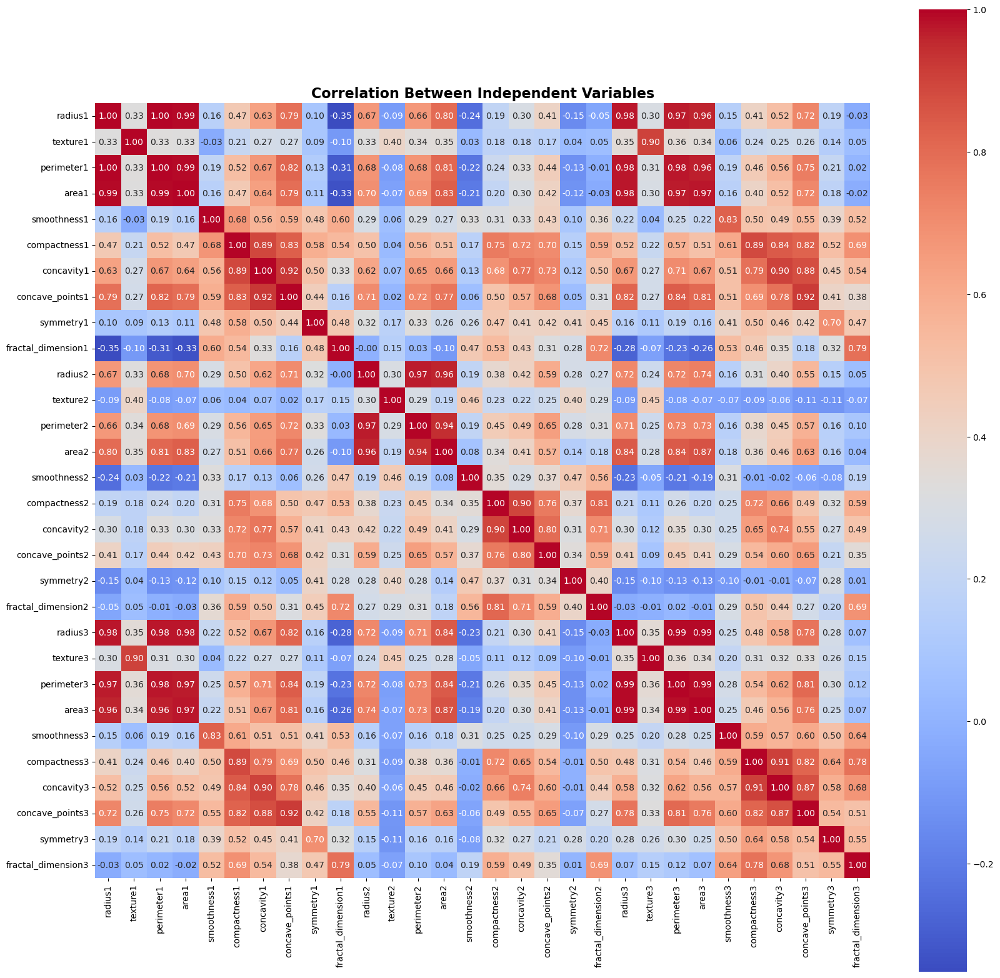

In [20]:
#Correlation B/W Independent Variables
correlation_matrix = pd.DataFrame(X_train_scaled, columns=X_train.columns).corr()

plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title("Correlation Between Independent Variables", fontweight="bold",fontsize=16)
plt.show()

C:\Users\likhi\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


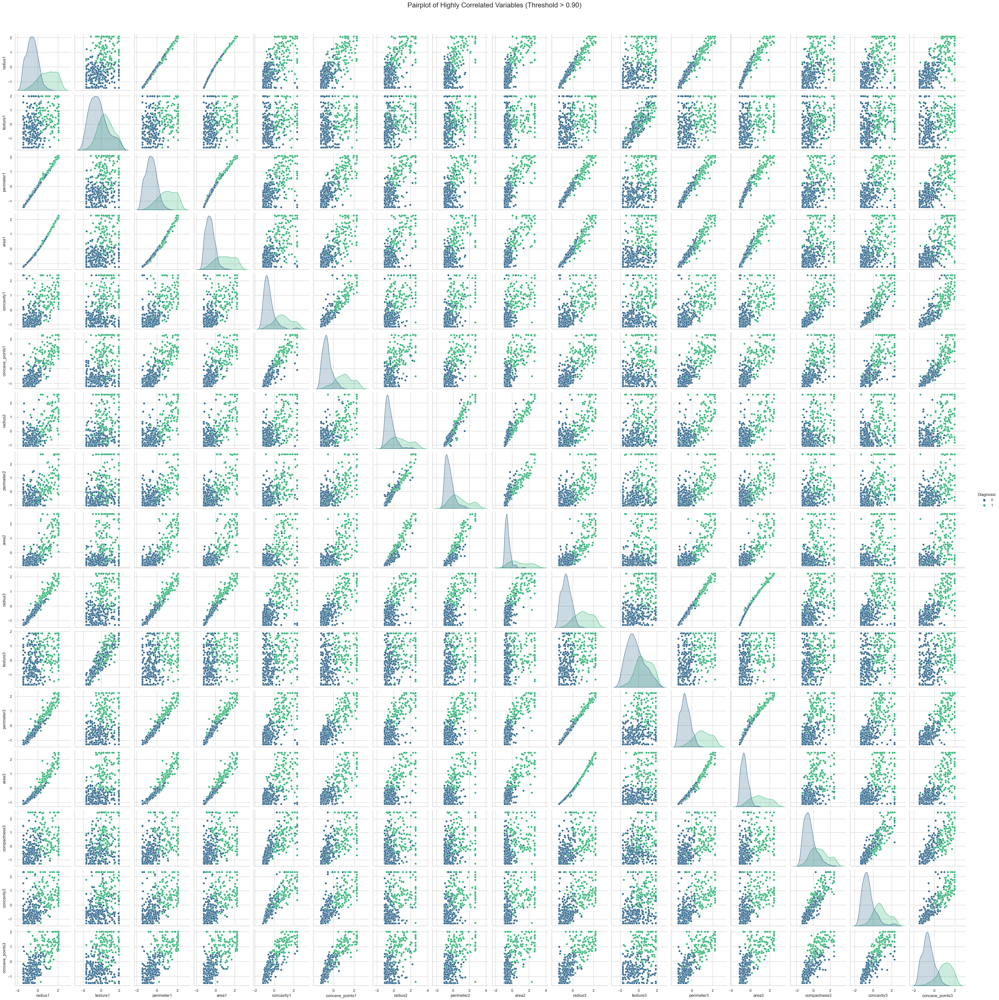

In [68]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation matrix
correlation_matrix = X_train_scaled_df.corr()

# Create a mask for the correlations greater than 0.85
mask = (correlation_matrix.abs() > 0.90) & (correlation_matrix != 1)

# Get the names of the highly correlated variables
high_corr_vars = correlation_matrix.columns[mask.any()].tolist()

# Include the target variable 'Diagnosis' for pairplot
if 'Diagnosis' not in high_corr_vars:
    high_corr_vars.append('Diagnosis')

# Create a pairplot of the highly correlated variables
sns.pairplot(X_train_scaled_df[high_corr_vars], hue='Diagnosis', palette='viridis')

# Show the plot
plt.suptitle('Pairplot of Highly Correlated Variables (Threshold > 0.90)', y=1.02, fontsize=20)
plt.show()


### Model Building And Evaluation

### 1.Logisitc Regression

In [115]:
# Train the model
log_reg = LogisticRegression()
log_reg.fit(X_train_scaled, y_train)

# Predictions
y_pred_log = log_reg.predict(X_test_scaled)

# Metrics
accuracy_log = accuracy_score(y_test, y_pred_log)
precision_log = precision_score(y_test, y_pred_log)
conf_matrix_log = confusion_matrix(y_test, y_pred_log)
sensitivity_log = conf_matrix_log[1, 1] / (conf_matrix_log[1, 0] + conf_matrix_log[1, 1])  # TP / (TP + FN)
specificity_log = conf_matrix_log[0, 0] / (conf_matrix_log[0, 0] + conf_matrix_log[0, 1])  # TN / (TN + FP)

# Print metrics
print(f"Overall Metrics:")
print(f"Accuracy: {accuracy_log:.2f}")
print(f"Precision: {precision_log:.2f}")
print(f"Sensitivity: {sensitivity_log:.2f}")
print(f"Specificity: {specificity_log:.2f}")

# Print confusion matrix as a table
print("\nConfusion Matrix:")
conf_matrix_df = pd.DataFrame(conf_matrix_log, 
                               index=["Actual Benign", "Actual Malignant"], 
                               columns=["Predicted Benign", "Predicted Malignant"])
print(conf_matrix_df)

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred_log, target_names=["Benign", "Malignant"]))


Overall Metrics:
Accuracy: 0.97
Precision: 1.00
Sensitivity: 0.92
Specificity: 1.00

Confusion Matrix:
                  Predicted Benign  Predicted Malignant
Actual Benign                  143                    0
Actual Malignant                 7                   78

Classification Report:
              precision    recall  f1-score   support

      Benign       0.95      1.00      0.98       143
   Malignant       1.00      0.92      0.96        85

    accuracy                           0.97       228
   macro avg       0.98      0.96      0.97       228
weighted avg       0.97      0.97      0.97       228



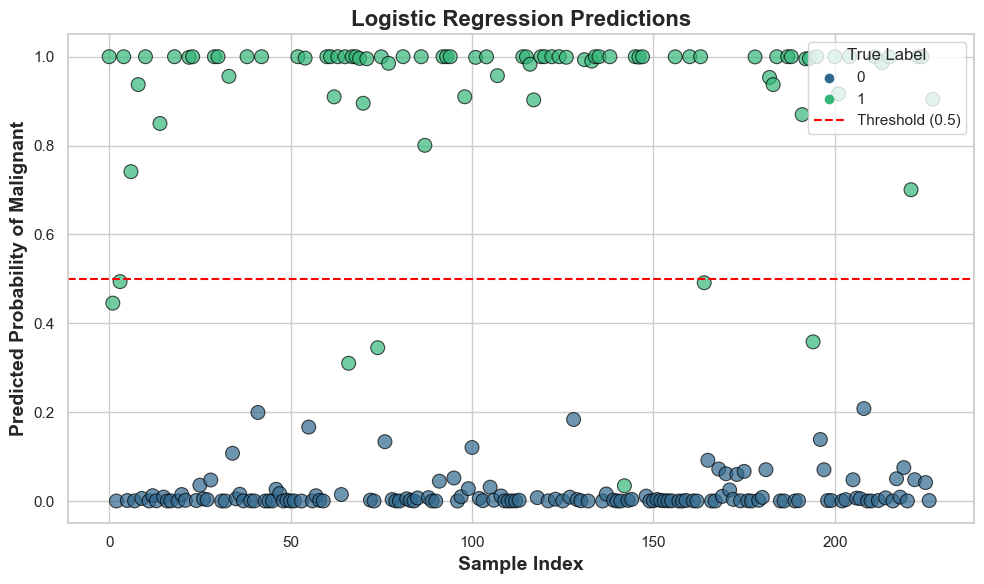

In [80]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Get predicted probabilities for the test data
y_prob_log = log_reg.predict_proba(X_test_scaled)[:, 1]

# Create a DataFrame for true labels and predicted probabilities
results_df = pd.DataFrame({'True Label': y_test, 'Predicted Probability': y_prob_log})

# Set the figure size
plt.figure(figsize=(10, 6))

# Create a scatter plot of predicted probabilities colored by the true label
sns.scatterplot(data=results_df, x=np.arange(len(results_df)), y='Predicted Probability', 
                hue='True Label', palette='viridis', alpha=0.7, edgecolor='black', s=100)

# Add a horizontal line for the decision threshold
plt.axhline(y=0.5, color='red', linestyle='--', label='Threshold (0.5)')

# Add titles and labels
plt.title('Logistic Regression Predictions', fontsize=16, fontweight='bold')
plt.xlabel('Sample Index', fontsize=14, fontweight='bold')
plt.ylabel('Predicted Probability of Malignant', fontsize=14, fontweight='bold')

# Add legend
plt.legend(title='True Label', loc='upper right')

# Show the plot
plt.tight_layout()
plt.show()



### 2.Random Forest

In [23]:
# Train the Random Forest model
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train_scaled, y_train)

# Predictions
y_pred_rf = rf_model.predict(X_test_scaled)

# Metrics
accuracy_rf = accuracy_score(y_test, y_pred_rf)
precision_rf = precision_score(y_test, y_pred_rf)
conf_matrix_rf = confusion_matrix(y_test, y_pred_rf)
sensitivity_rf = conf_matrix_rf[1, 1] / (conf_matrix_rf[1, 0] + conf_matrix_rf[1, 1])  # TP / (TP + FN)
specificity_rf = conf_matrix_rf[0, 0] / (conf_matrix_rf[0, 0] + conf_matrix_rf[0, 1])  # TN / (TN + FP)

# Print overall metrics
print("Overall Metrics:")
print(f"Accuracy: {accuracy_rf:.2f}")
print(f"Precision: {precision_rf:.2f}")
print(f"Sensitivity: {sensitivity_rf:.2f}")
print(f"Specificity: {specificity_rf:.2f}")

# Print confusion matrix as a table
print("\nConfusion Matrix:")
confusion_df = pd.DataFrame(conf_matrix_rf, 
                            index=['Actual Benign', 'Actual Malignant'], 
                            columns=['Predicted Benign', 'Predicted Malignant'])
print(confusion_df)

# Print classification report for detailed metrics
print("\nClassification Report:")
print(classification_report(y_test, y_pred_rf))


Overall Metrics:
Accuracy: 0.97
Precision: 0.99
Sensitivity: 0.93
Specificity: 0.99

Confusion Matrix:
                  Predicted Benign  Predicted Malignant
Actual Benign                  142                    1
Actual Malignant                 6                   79

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.99      0.98       143
           1       0.99      0.93      0.96        85

    accuracy                           0.97       228
   macro avg       0.97      0.96      0.97       228
weighted avg       0.97      0.97      0.97       228



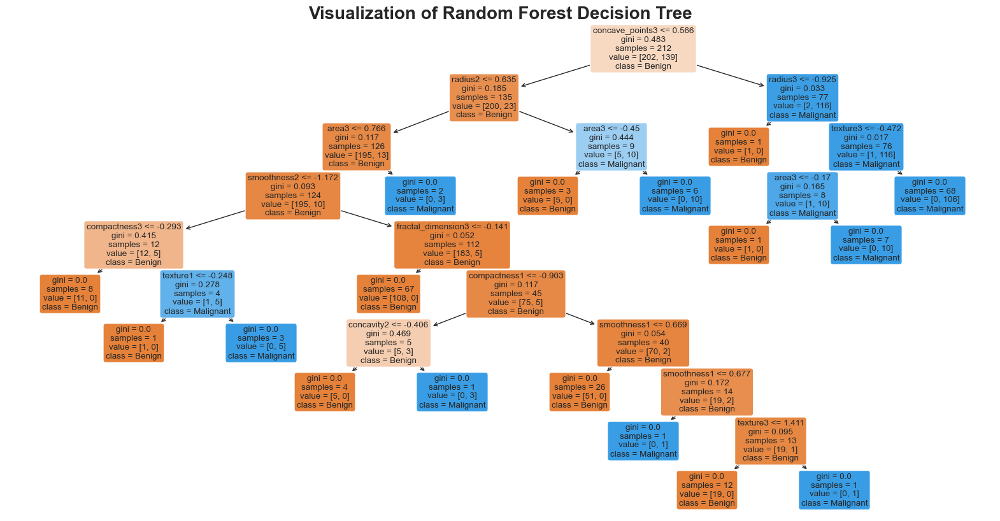

In [84]:
plt.figure(figsize=(20, 10))

plot_tree(rf_model.estimators_[0], 
          feature_names=X_train.columns.tolist(),  
          class_names=['Benign', 'Malignant'], 
          filled=True, 
          rounded=True)

# Set title for the plot
plt.title('Visualization of Random Forest Decision Tree', fontsize=20, fontweight='bold')
plt.show()

### 3.Decision Tree

In [24]:
# Train the Decision Tree model
dt_model = DecisionTreeClassifier()
dt_model.fit(X_train_scaled, y_train)

# Predictions
y_pred_dt = dt_model.predict(X_test_scaled)

# Metrics
accuracy_dt = accuracy_score(y_test, y_pred_dt)
precision_dt = precision_score(y_test, y_pred_dt)
recall_dt = recall_score(y_test, y_pred_dt)
conf_matrix_dt = confusion_matrix(y_test, y_pred_dt)

# Calculate Sensitivity and Specificity
sensitivity_dt = conf_matrix_dt[1, 1] / (conf_matrix_dt[1, 0] + conf_matrix_dt[1, 1])  # TP / (TP + FN)
specificity_dt = conf_matrix_dt[0, 0] / (conf_matrix_dt[0, 0] + conf_matrix_dt[0, 1])  # TN / (TN + FP)

# Print overall metrics
print(f"Overall Metrics for Decision Tree:")
print(f"Accuracy: {accuracy_dt:.2f}")
print(f"Precision: {precision_dt:.2f}")
print(f"Sensitivity: {sensitivity_dt:.2f}")
print(f"Specificity: {specificity_dt:.2f}")

# Confusion Matrix
print("\nConfusion Matrix:")
print(f"{'':<20}{'Predicted Benign':<20}{'Predicted Malignant'}")
print(f"{'Actual Benign':<20}{conf_matrix_dt[0, 0]:<20}{conf_matrix_dt[0, 1]}")
print(f"{'Actual Malignant':<20}{conf_matrix_dt[1, 0]:<20}{conf_matrix_dt[1, 1]}")

# Classification Report
print("\nClassification Report:")
print(classification_report(y_test, y_pred_dt))


Overall Metrics for Decision Tree:
Accuracy: 0.94
Precision: 0.94
Sensitivity: 0.89
Specificity: 0.97

Confusion Matrix:
                    Predicted Benign    Predicted Malignant
Actual Benign       138                 5
Actual Malignant    9                   76

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.97      0.95       143
           1       0.94      0.89      0.92        85

    accuracy                           0.94       228
   macro avg       0.94      0.93      0.93       228
weighted avg       0.94      0.94      0.94       228



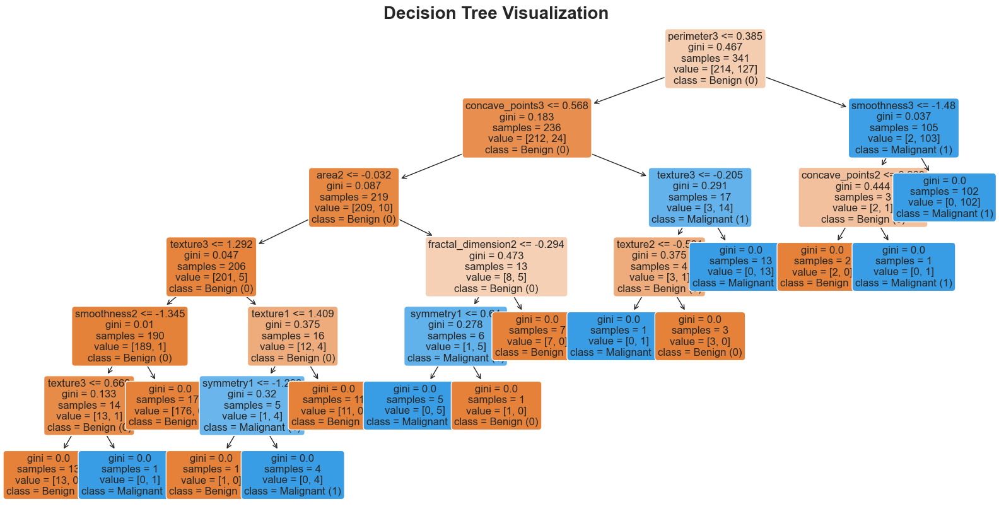

In [100]:
plt.figure(figsize=(20, 10))
plot_tree(dt_model, 
          filled=True, 
          feature_names=X_train.columns.tolist(),  
          class_names=['Benign (0)', 'Malignant (1)'], 
          rounded=True, 
          fontsize=12)

plt.title('Decision Tree Visualization', fontsize=20, fontweight='bold')

plt.show()



### 4.Support Vector Machine(SVM)

In [25]:
# Train the model
svm_model = SVC()
svm_model.fit(X_train_scaled, y_train)

# Predictions
y_pred_svm = svm_model.predict(X_test_scaled)

# Metrics
accuracy_svm = accuracy_score(y_test, y_pred_svm)
precision_svm = precision_score(y_test, y_pred_svm)
conf_matrix_svm = confusion_matrix(y_test, y_pred_svm)
sensitivity_svm = conf_matrix_svm[1, 1] / (conf_matrix_svm[1, 0] + conf_matrix_svm[1, 1])  # TP / (TP + FN)
specificity_svm = conf_matrix_svm[0, 0] / (conf_matrix_svm[0, 0] + conf_matrix_svm[0, 1])  # TN / (TN + FP)

# Print overall metrics
print(f"Overall Metrics for Support Vector Machine:")
print(f"Accuracy: {accuracy_svm:.2f}")
print(f"Precision: {precision_svm:.2f}")
print(f"Sensitivity: {sensitivity_svm:.2f}")
print(f"Specificity: {specificity_svm:.2f}")

# Confusion Matrix
confusion_matrix_df = pd.DataFrame(conf_matrix_svm, 
                                    index=['Actual Benign', 'Actual Malignant'], 
                                    columns=['Predicted Benign', 'Predicted Malignant'])
print("\nConfusion Matrix:")
print(confusion_matrix_df)

# Classification Report
classification_report_svm = classification_report(y_test, y_pred_svm, target_names=['Benign', 'Malignant'])
print("\nClassification Report:")
print(classification_report_svm)


Overall Metrics for Support Vector Machine:
Accuracy: 0.97
Precision: 1.00
Sensitivity: 0.93
Specificity: 1.00

Confusion Matrix:
                  Predicted Benign  Predicted Malignant
Actual Benign                  143                    0
Actual Malignant                 6                   79

Classification Report:
              precision    recall  f1-score   support

      Benign       0.96      1.00      0.98       143
   Malignant       1.00      0.93      0.96        85

    accuracy                           0.97       228
   macro avg       0.98      0.96      0.97       228
weighted avg       0.97      0.97      0.97       228



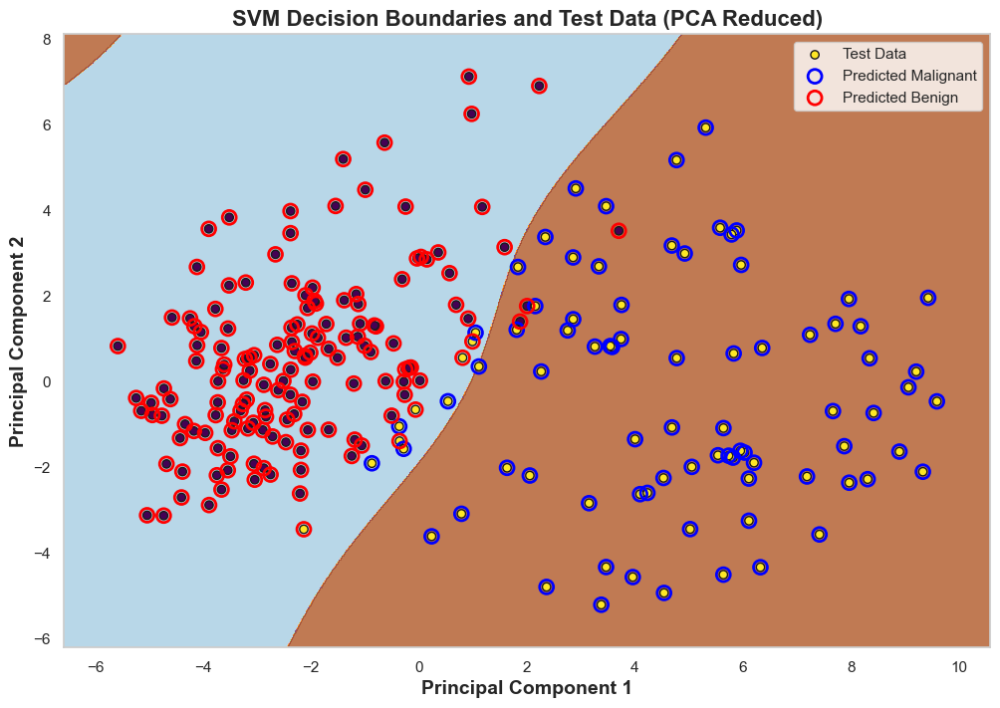

In [107]:
from sklearn.decomposition import PCA


pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)


svm_model_pca = SVC()
svm_model_pca.fit(X_train_pca, y_train)


h = .02  
x_min, x_max = X_test_pca[:, 0].min() - 1, X_test_pca[:, 0].max() + 1
y_min, y_max = X_test_pca[:, 1].min() - 1, X_test_pca[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))


Z = svm_model_pca.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)


plt.figure(figsize=(12, 8))
plt.contourf(xx, yy, Z, alpha=0.8, cmap='Paired')


plt.scatter(X_test_pca[:, 0], X_test_pca[:, 1], c=y_test, edgecolors='k', marker='o', cmap='viridis', label='Test Data')


plt.scatter(X_test_pca[y_pred_svm == 1, 0], X_test_pca[y_pred_svm == 1, 1], s=100, facecolors='none', edgecolors='blue', label='Predicted Malignant', linewidth=2)
plt.scatter(X_test_pca[y_pred_svm == 0, 0], X_test_pca[y_pred_svm == 0, 1], s=100, facecolors='none', edgecolors='red', label='Predicted Benign', linewidth=2)


plt.title('SVM Decision Boundaries and Test Data (PCA Reduced)', fontsize=16, fontweight='bold')
plt.xlabel('Principal Component 1', fontsize=14, fontweight='bold')
plt.ylabel('Principal Component 2', fontsize=14, fontweight='bold')
plt.legend()
plt.grid()
plt.show()



### 5.Perceptron

In [26]:
# Train the model
perceptron_model = Perceptron()
perceptron_model.fit(X_train_scaled, y_train)

# Predictions
y_pred_perceptron = perceptron_model.predict(X_test_scaled)

# Metrics
accuracy_perceptron = accuracy_score(y_test, y_pred_perceptron)
precision_perceptron = precision_score(y_test, y_pred_perceptron)
conf_matrix_perceptron = confusion_matrix(y_test, y_pred_perceptron)

# Calculate sensitivity and specificity
sensitivity_perceptron = conf_matrix_perceptron[1, 1] / (conf_matrix_perceptron[1, 0] + conf_matrix_perceptron[1, 1])  # TP / (TP + FN)
specificity_perceptron = conf_matrix_perceptron[0, 0] / (conf_matrix_perceptron[0, 0] + conf_matrix_perceptron[0, 1])  # TN / (TN + FP)

# Print overall metrics
print(f"Overall Metrics for Perceptron:")
print(f"Accuracy: {accuracy_perceptron:.2f}")
print(f"Precision: {precision_perceptron:.2f}")
print(f"Sensitivity: {sensitivity_perceptron:.2f}")
print(f"Specificity: {specificity_perceptron:.2f}")

# Print confusion matrix as a table
print("\nConfusion Matrix:")
confusion_df = pd.DataFrame(conf_matrix_perceptron, 
                            index=["Actual Benign", "Actual Malignant"], 
                            columns=["Predicted Benign", "Predicted Malignant"])
print(confusion_df)

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred_perceptron))


Overall Metrics for Perceptron:
Accuracy: 0.98
Precision: 0.98
Sensitivity: 0.98
Specificity: 0.99

Confusion Matrix:
                  Predicted Benign  Predicted Malignant
Actual Benign                  141                    2
Actual Malignant                 2                   83

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       143
           1       0.98      0.98      0.98        85

    accuracy                           0.98       228
   macro avg       0.98      0.98      0.98       228
weighted avg       0.98      0.98      0.98       228



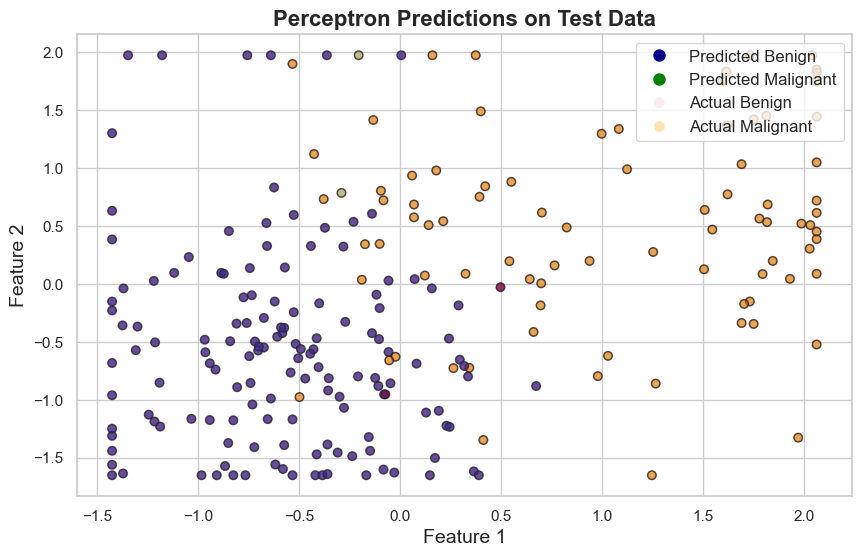

In [112]:
plt.figure(figsize=(10, 6))

plt.scatter(X_test_scaled[:, 0], X_test_scaled[:, 1], 
            c=y_pred_perceptron, cmap='viridis', edgecolor='k', alpha=0.7)

plt.scatter(X_test_scaled[:, 0], X_test_scaled[:, 1], 
            c=y_test, cmap='coolwarm', marker='o', s=40, edgecolor='k', alpha=0.3)

plt.title('Perceptron Predictions on Test Data', fontsize=16, fontweight='bold')
plt.xlabel('Feature 1', fontsize=14)
plt.ylabel('Feature 2', fontsize=14)

handles = [plt.Line2D([0], [0], marker='o', color='w', label='Predicted Benign', 
                       markerfacecolor='darkblue', markersize=10),
           plt.Line2D([0], [0], marker='o', color='w', label='Predicted Malignant', 
                       markerfacecolor='green', markersize=10),
           plt.Line2D([0], [0], marker='o', color='w', label='Actual Benign', 
                       markerfacecolor='pink', markersize=8, alpha=0.3),
           plt.Line2D([0], [0], marker='o', color='w', label='Actual Malignant', 
                       markerfacecolor='orange', markersize=8, alpha=0.3)]

plt.legend(handles=handles, loc='upper right', fontsize=12)
plt.grid(True)
plt.show()


### 6.Gradient Boosting Classifier

In [27]:
# Train the model
gb_model = GradientBoostingClassifier()
gb_model.fit(X_train_scaled, y_train)

# Predictions
y_pred_gb = gb_model.predict(X_test_scaled)

# Metrics
accuracy_gb = accuracy_score(y_test, y_pred_gb)
precision_gb = precision_score(y_test, y_pred_gb)
conf_matrix_gb = confusion_matrix(y_test, y_pred_gb)
sensitivity_gb = conf_matrix_gb[1, 1] / (conf_matrix_gb[1, 0] + conf_matrix_gb[1, 1])  # TP / (TP + FN)
specificity_gb = conf_matrix_gb[0, 0] / (conf_matrix_gb[0, 0] + conf_matrix_gb[0, 1])  # TN / (TN + FP)

# Print overall metrics
print(f"Overall Metrics for Gradient Boosting:")
print(f"Accuracy: {accuracy_gb:.2f}")
print(f"Precision: {precision_gb:.2f}")
print(f"Sensitivity: {sensitivity_gb:.2f}")
print(f"Specificity: {specificity_gb:.2f}")

# Print confusion matrix as a table
print("\nConfusion Matrix:")
print("                  Predicted Benign  Predicted Malignant")
print(f"Actual Benign                  {conf_matrix_gb[0, 0]}                    {conf_matrix_gb[0, 1]}")
print(f"Actual Malignant               {conf_matrix_gb[1, 0]}                   {conf_matrix_gb[1, 1]}")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred_gb))


Overall Metrics for Gradient Boosting:
Accuracy: 0.96
Precision: 0.99
Sensitivity: 0.92
Specificity: 0.99

Confusion Matrix:
                  Predicted Benign  Predicted Malignant
Actual Benign                  142                    1
Actual Malignant               7                   78

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.99      0.97       143
           1       0.99      0.92      0.95        85

    accuracy                           0.96       228
   macro avg       0.97      0.96      0.96       228
weighted avg       0.97      0.96      0.96       228



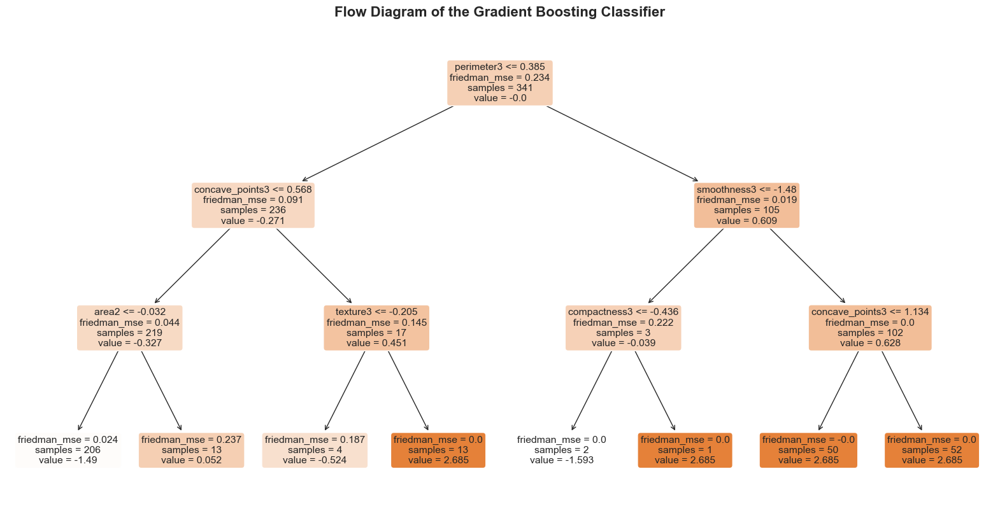

In [114]:
tree_to_plot = gb_model.estimators_[0, 0]
plt.figure(figsize=(20, 10))
feature_names_list = list(X_train.columns)

plot_tree(tree_to_plot, 
          feature_names=feature_names_list, 
          class_names=['Benign', 'Malignant'], 
          filled=True, 
          rounded=True)

plt.title("Flow Diagram of the Gradient Boosting Classifier", fontsize=16, fontweight='bold')
plt.show()


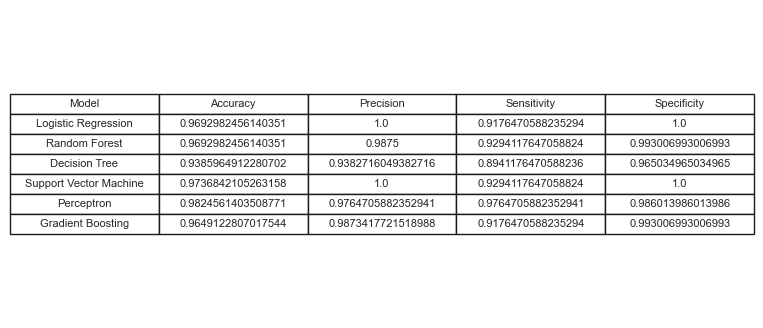

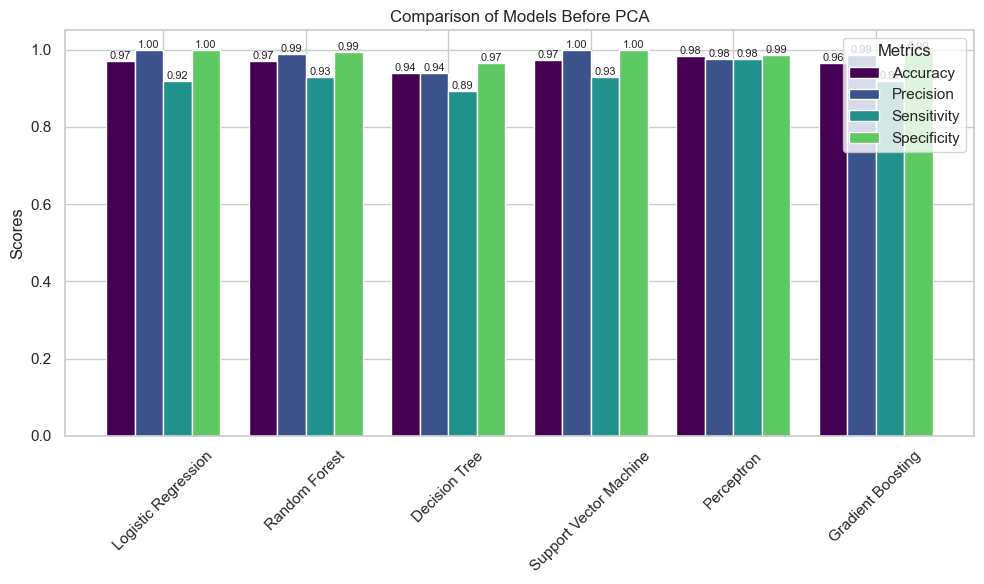

In [125]:
# Define a dictionary to hold the metrics for each model
metrics_dict = {
    "Model": ["Logistic Regression", "Random Forest", "Decision Tree", "Support Vector Machine", "Perceptron", "Gradient Boosting"],
    "Accuracy": [accuracy_log, accuracy_rf, accuracy_dt, accuracy_svm, accuracy_perceptron, accuracy_gb],
    "Precision": [precision_log, precision_rf, precision_dt, precision_svm, precision_perceptron, precision_gb],
    "Sensitivity": [sensitivity_log, sensitivity_rf, sensitivity_dt, sensitivity_svm, sensitivity_perceptron, sensitivity_gb],
    "Specificity": [specificity_log, specificity_rf, specificity_dt, specificity_svm, specificity_perceptron, specificity_gb]
}

# Create a DataFrame from the dictionary
comparison_df = pd.DataFrame(metrics_dict)

# Create a figure and axis for the table
fig, ax = plt.subplots(figsize=(8, 4)) 

# Hide axes for the table
ax.axis('tight')
ax.axis('off')

# Create a table
table = ax.table(cellText=comparison_df.values, colLabels=comparison_df.columns, cellLoc='center', loc='center')

# Set table properties
table.auto_set_font_size(False)
table.set_fontsize(8)
table.scale(1.2, 1.2) 
plt.show()
fig, ax = plt.subplots(figsize=(10, 6))
bar_width = 0.2
x = np.arange(len(comparison_df))
for i, metric in enumerate(metrics):
    bars = ax.bar(x + i * bar_width, comparison_df[metric], width=bar_width, label=metric, color=plt.cm.viridis(i / len(metrics)))
    
    # Add values on top of each bar
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.2f}', ha='center', va='bottom', fontsize=8)

# Set the x-ticks and labels
ax.set_xticks(x + bar_width * (len(metrics) - 1) / 2)
ax.set_xticklabels(comparison_df['Model'], rotation=45)
ax.set_ylabel('Scores')
ax.set_title('Comparison of Models Before PCA')
ax.legend(title='Metrics')

# Show the bar plot
plt.tight_layout()
plt.show()


The output presents a comparison of various machine learning models based on key performance metrics: accuracy, precision, sensitivity, and specificity. Logistic Regression and Support Vector Machine (SVM) showcase high accuracy (above 96%) and perfect precision and sensitivity scores, indicating their effectiveness in correctly identifying positive instances. Random Forest and Perceptron also perform well, particularly in sensitivity, highlighting their ability to detect positive cases. Decision Tree, while slightly lower in sensitivity, still maintains a solid performance. Overall, the results suggest that SVM and Logistic Regression are the most reliable models, with high scores across all metrics, making them suitable for classification tasks.

### Dimensionality Reduction and Model Evaluation with PCA

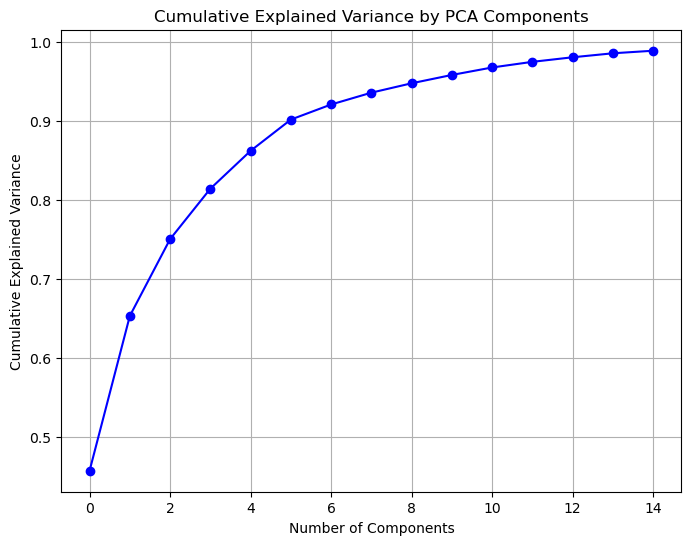

Explained variance ratio for each component: [0.45742194 0.19584962 0.09716596 0.06378948 0.04793708 0.03950607
 0.01909468 0.01494575 0.01188529 0.01053294 0.00945349 0.00714172
 0.00576756 0.00504206 0.00323978]
Cumulative explained variance: [0.45742194 0.65327156 0.75043752 0.814227   0.86216407 0.90167014
 0.92076482 0.93571057 0.94759586 0.95812881 0.96758229 0.97472402
 0.98049157 0.98553364 0.98877342]


In [29]:
pca = PCA(n_components=15)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Cumulative explained variance plot
plt.figure(figsize=(8, 6))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o', color='b')
plt.title('Cumulative Explained Variance by PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid()
plt.show()

# Explained variance ratio for each component
print(f'Explained variance ratio for each component: {pca.explained_variance_ratio_}')
print(f'Cumulative explained variance: {np.cumsum(pca.explained_variance_ratio_)}')


In [126]:
# List of models
models = {
    "Logistic Regression": LogisticRegression(),
    "Random Forest": RandomForestClassifier(),
    "Decision Tree": DecisionTreeClassifier(),
    "Support Vector Machine": SVC(probability=True),
    "Perceptron": Perceptron(),
    "Gradient Boosting": GradientBoostingClassifier()
}

# Evaluate each model
for name, model in models.items():
    # Train the model
    model.fit(X_train_pca, y_train)
    
    # Predictions
    y_pred = model.predict(X_test_pca)
    
    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')  # Use weighted average for multi-class
    sensitivity = recall_score(y_test, y_pred, pos_label=1)  # Use pos_label=1 for Malignant
    specificity = recall_score(y_test, y_pred, pos_label=0)  # Use pos_label=0 for Benign

    # Print metrics
    print(f"Model: {name}")
    print(f"Accuracy: {accuracy:.2f}")
    print(f"Precision: {precision:.2f}")
    print(f"Sensitivity (Recall for Malignant): {sensitivity:.2f}")
    print(f"Specificity (Recall for Benign): {specificity:.2f}")

    # Print confusion matrix as a table
    conf_matrix = confusion_matrix(y_test, y_pred)
    conf_matrix_df = pd.DataFrame(conf_matrix, 
                                   index=["Actual Benign (0)", "Actual Malignant (1)"], 
                                   columns=["Predicted Benign (0)", "Predicted Malignant (1)"])
    print("\nConfusion Matrix:")
    print(conf_matrix_df)

    # Print classification report
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred, target_names=["Benign (0)", "Malignant (1)"]))
    
    print("=" * 50)


Model: Logistic Regression
Accuracy: 0.95
Precision: 0.95
Sensitivity (Recall for Malignant): 0.91
Specificity (Recall for Benign): 0.98

Confusion Matrix:
                      Predicted Benign (0)  Predicted Malignant (1)
Actual Benign (0)                      140                        3
Actual Malignant (1)                     8                       77

Classification Report:
               precision    recall  f1-score   support

   Benign (0)       0.95      0.98      0.96       143
Malignant (1)       0.96      0.91      0.93        85

     accuracy                           0.95       228
    macro avg       0.95      0.94      0.95       228
 weighted avg       0.95      0.95      0.95       228

Model: Random Forest
Accuracy: 0.95
Precision: 0.95
Sensitivity (Recall for Malignant): 0.88
Specificity (Recall for Benign): 0.99

Confusion Matrix:
                      Predicted Benign (0)  Predicted Malignant (1)
Actual Benign (0)                      141                       

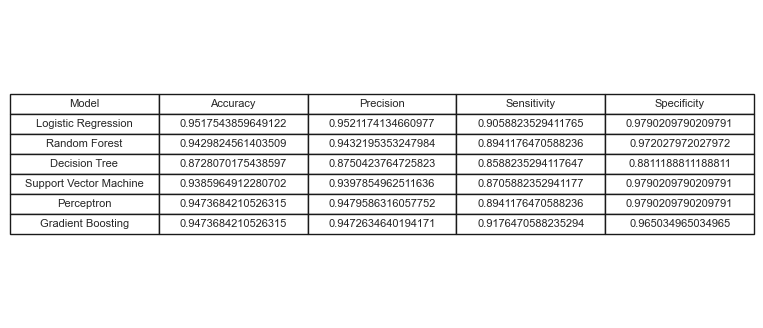

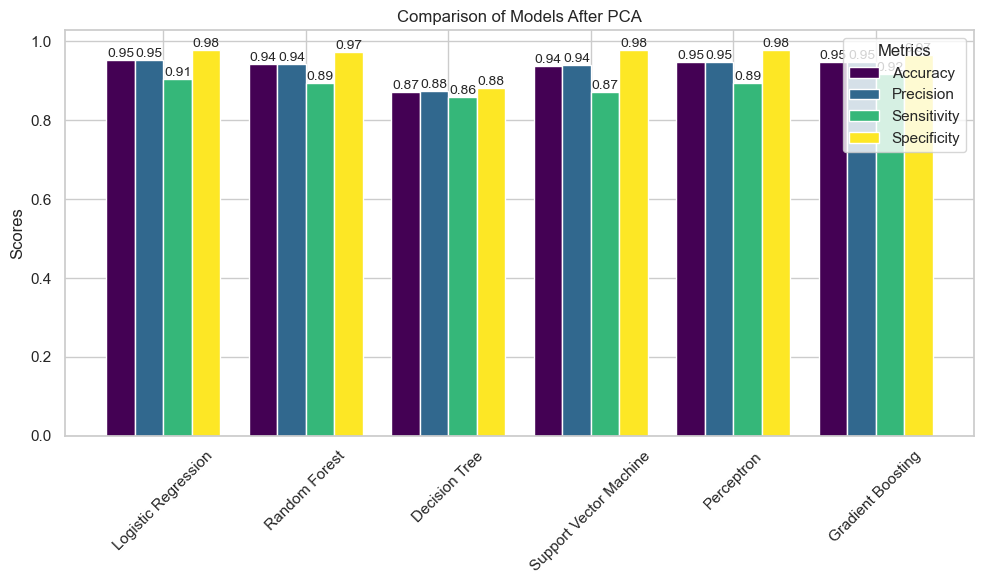

In [127]:
from sklearn.metrics import accuracy_score, precision_score, recall_score

# Initialize lists to store metrics for each model
model_names = []
accuracies = []
precisions = []
sensitivities = []
specificities = []


for name, model in models.items():
    model.fit(X_train_pca, y_train)
    y_pred = model.predict(X_test_pca)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')  
    sensitivity = recall_score(y_test, y_pred, pos_label=1)  
    specificity = recall_score(y_test, y_pred, pos_label=0)  

    
    model_names.append(name)
    accuracies.append(accuracy)
    precisions.append(precision)
    sensitivities.append(sensitivity)
    specificities.append(specificity)


metrics_df = pd.DataFrame({
    "Model": model_names,
    "Accuracy": accuracies,
    "Precision": precisions,
    "Sensitivity": sensitivities,
    "Specificity": specificities
})


fig, ax = plt.subplots(figsize=(8, 4))  
ax.axis('tight')
ax.axis('off')

table = ax.table(cellText=metrics_df.values, colLabels=metrics_df.columns, cellLoc='center', loc='center')

table.auto_set_font_size(False)
table.set_fontsize(8)
table.scale(1.2, 1.2) 

plt.show()

metrics = ['Accuracy', 'Precision', 'Sensitivity', 'Specificity']
bar_width = 0.2
x = np.arange(len(metrics_df['Model']))

fig, ax = plt.subplots(figsize=(10, 6))

colors = plt.cm.viridis(np.linspace(0, 1, len(metrics)))
for i, metric in enumerate(metrics):
    bars = ax.bar(x + i * bar_width, metrics_df[metric], width=bar_width, label=metric, color=colors[i])
    
    # Add values on top of each bar
    for bar in bars:
        yval = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), ha='center', va='bottom', fontsize=10)

ax.set_xticks(x + bar_width * (len(metrics) - 1) / 2)
ax.set_xticklabels(metrics_df['Model'], rotation=45)
ax.set_ylabel('Scores')
ax.set_title('Comparison of Models After PCA')
ax.legend(title='Metrics')

plt.tight_layout()
plt.show()



### Conclusion

# Predicting Cardiovascular Risk: A Machine Learning Approach to Heart Disease Classification

### Importing Required Packages

In [128]:
!pip3 install -U ucimlrepo 
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from scipy.stats import mstats
from scipy.stats.mstats import winsorize 
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, roc_curve, auc
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.linear_model import Perceptron
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.decomposition import PCA

### Loading Heart disease Dataset

In [129]:

column_names = ['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach', 'exang', 
                'oldpeak', 'slope', 'ca', 'thal', 'num']

df_cleveland = pd.read_csv('processed.cleveland.csv', header=None, names=column_names)
df_hungary = pd.read_csv('processed.hungarian.csv', header=None, names=column_names)
df_switzerland = pd.read_csv('processed.switzerland.csv', header=None, names=column_names)
df_valb = pd.read_csv('processed.va.csv', header=None, names=column_names)

Heart_df  = pd.concat([df_cleveland, df_hungary, df_switzerland, df_valb], ignore_index=True)


### Dataset Overview And Preprocessing

In [130]:
# Convert columns to numeric (int/float), coerce errors to NaN
Heart_df['trestbps'] = pd.to_numeric(Heart_df['trestbps'], errors='coerce')
Heart_df['chol'] = pd.to_numeric(Heart_df['chol'], errors='coerce')
Heart_df['thalach'] = pd.to_numeric(Heart_df['thalach'], errors='coerce')
Heart_df['oldpeak'] = pd.to_numeric(Heart_df['oldpeak'], errors='coerce')

# Convert categorical columns
Heart_df['sex'] = Heart_df['sex'].astype('category')
Heart_df['cp'] = Heart_df['cp'].astype('category')
Heart_df['fbs'] = Heart_df['fbs'].astype('category')
Heart_df['restecg'] = Heart_df['restecg'].astype('category')
Heart_df['exang'] = Heart_df['exang'].astype('category')
Heart_df['slope'] = Heart_df['slope'].astype('category')
Heart_df['thal'] = Heart_df['thal'].astype('category')

# Convert 'ca' to float, if necessary
Heart_df['ca'] = pd.to_numeric(Heart_df['ca'], errors='coerce')

# Convert 'num' to int (assuming it has no NaNs after conversion)
Heart_df['num'] = Heart_df['num'].astype(int)

# Check the data types after conversion
print(Heart_df.dtypes)

# Replace "?" with NaN
Heart_df.replace("?", np.nan, inplace=True)
print(Heart_df.isnull().sum())

# For numerical columns, we can use the median to impute missing values
numerical_columns = Heart_df.select_dtypes(include=['float64', 'Int64']).columns

for col in numerical_columns:
    median_value = Heart_df[col].median()
    Heart_df[col].fillna(median_value, inplace=True)

# For categorical columns, we can use the mode to impute missing values
categorical_columns = Heart_df.select_dtypes(include=['category']).columns

for col in categorical_columns:
    Heart_df[col] = Heart_df[col].astype('object')  # Change to object type
    mode_value = Heart_df[col].mode()[0]  # Get the first mode
    Heart_df[col].fillna(mode_value, inplace=True)

# Verify that there are no missing values left
print(Heart_df.isnull().sum())

age          float64
sex         category
cp          category
trestbps     float64
chol         float64
fbs         category
restecg     category
thalach      float64
exang       category
oldpeak      float64
slope       category
ca           float64
thal        category
num            int32
dtype: object
age           0
sex           0
cp            0
trestbps     59
chol         30
fbs          90
restecg       2
thalach      55
exang        55
oldpeak      62
slope       309
ca          611
thal        486
num           0
dtype: int64
age         0
sex         0
cp          0
trestbps    0
chol        0
fbs         0
restecg     0
thalach     0
exang       0
oldpeak     0
slope       0
ca          0
thal        0
num         0
dtype: int64


In [131]:
# Get the total number of classes and their counts for the 'num' column
class_counts = Heart_df['num'].value_counts()

# Display the counts of each class
print(class_counts)

# Get the total number of classes
total_classes = class_counts.count()
print(f'Total number of classes: {total_classes}')


num
0    411
1    265
2    109
3    107
4     28
Name: count, dtype: int64
Total number of classes: 5


In [132]:
Heart_df.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
0,63.0,1.0,1.0,145.0,233.0,1.0,2.0,150.0,0.0,2.3,3.0,0.0,6.0,0
1,67.0,1.0,4.0,160.0,286.0,0.0,2.0,108.0,1.0,1.5,2.0,3.0,3.0,2
2,67.0,1.0,4.0,120.0,229.0,0.0,2.0,129.0,1.0,2.6,2.0,2.0,7.0,1
3,37.0,1.0,3.0,130.0,250.0,0.0,0.0,187.0,0.0,3.5,3.0,0.0,3.0,0
4,41.0,0.0,2.0,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0,0


In [133]:
Heart_df.tail()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
915,54.0,0.0,4.0,127.0,333.0,1,1.0,154.0,0,0.0,2,0.0,3.0,1
916,62.0,1.0,1.0,130.0,139.0,0,1.0,140.0,0,0.5,2,0.0,3.0,0
917,55.0,1.0,4.0,122.0,223.0,1,1.0,100.0,0,0.0,2,0.0,6,2
918,58.0,1.0,4.0,130.0,385.0,1,2.0,140.0,0,0.5,2,0.0,3.0,0
919,62.0,1.0,2.0,120.0,254.0,0,2.0,93.0,1,0.0,2,0.0,3.0,1


In [134]:
Heart_df.shape

(920, 14)

In [135]:
Heart_df.describe()

,age,trestbps,chol,thalach,oldpeak,ca,num
count,920.000000,920.000000,920.000000,920.000000,920.000000,920.000000,920.000000
mean,53.510870,131.995652,199.908696,137.692391,0.853261,0.227174,0.995652
std,9.424685,18.451300,109.040171,25.145235,1.058049,0.628936,1.142693
min,28.000000,0.000000,0.000000,60.000000,-2.600000,0.000000,0.000000
25%,47.000000,120.000000,177.750000,120.000000,0.000000,0.000000,0.000000
50%,54.000000,130.000000,223.000000,140.000000,0.500000,0.000000,1.000000
75%,60.000000,140.000000,267.000000,156.000000,1.500000,0.000000,2.000000
max,77.000000,200.000000,603.000000,202.000000,6.200000,3.000000,4.000000


In [136]:
Heart_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 920 entries, 0 to 919
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       920 non-null    float64
 1   sex       920 non-null    object 
 2   cp        920 non-null    object 
 3   trestbps  920 non-null    float64
 4   chol      920 non-null    float64
 5   fbs       920 non-null    object 
 6   restecg   920 non-null    object 
 7   thalach   920 non-null    float64
 8   exang     920 non-null    object 
 9   oldpeak   920 non-null    float64
 10  slope     920 non-null    object 
 11  ca        920 non-null    float64
 12  thal      920 non-null    object 
 13  num       920 non-null    int32  
dtypes: float64(6), int32(1), object(7)
memory usage: 97.2+ KB


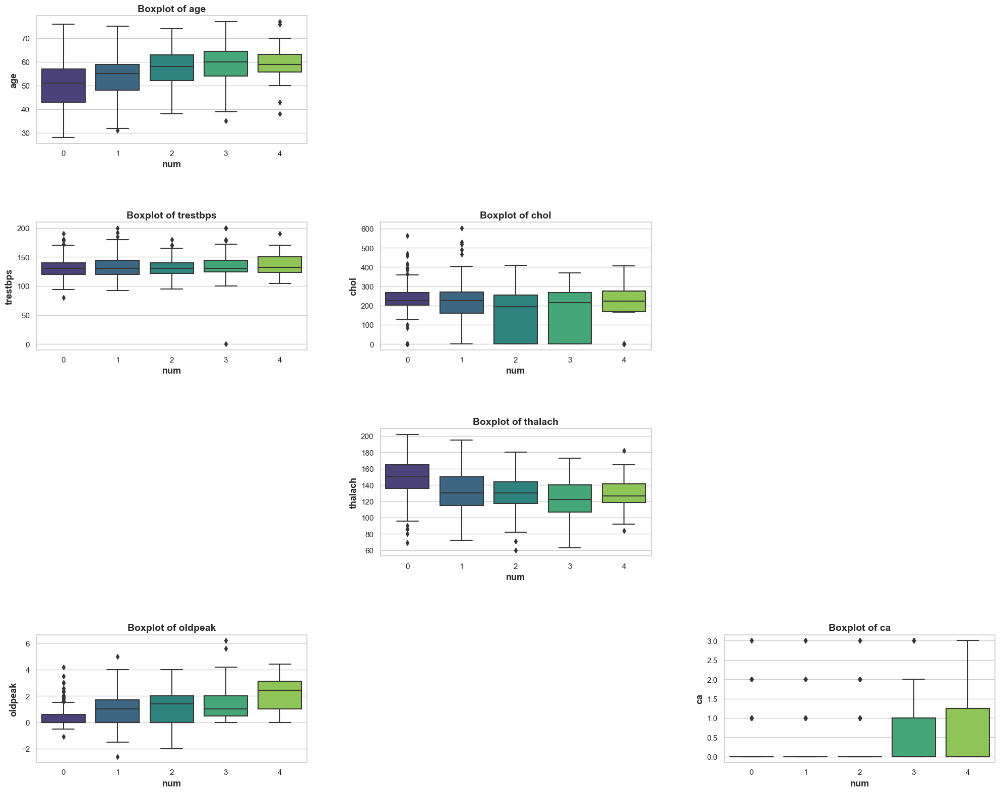

In [137]:
# Detecting Outliers
plt.figure(figsize=(20, 40))

# Independent variables (all columns except 'num')
independent_vars = Heart_df.columns[:-1]  # Exclude the target variable 'num'

# Create a boxplot for each variable to check for outliers
for i, col in enumerate(independent_vars):
    
    # Check if the current column (col) is numeric
    if pd.api.types.is_numeric_dtype(Heart_df[col]):
        plt.subplot(10, 3, i + 1)  # Adjust the grid size as needed
        sns.boxplot(x='num', y=col, data=Heart_df, palette='viridis')
        plt.xlabel('num', fontsize=13, fontweight='bold')
        plt.ylabel(col, fontsize=13, fontweight='bold')
        plt.title(f'Boxplot of {col}', fontsize=14, fontweight='bold')

plt.tight_layout(w_pad=5, h_pad=5)
plt.show()


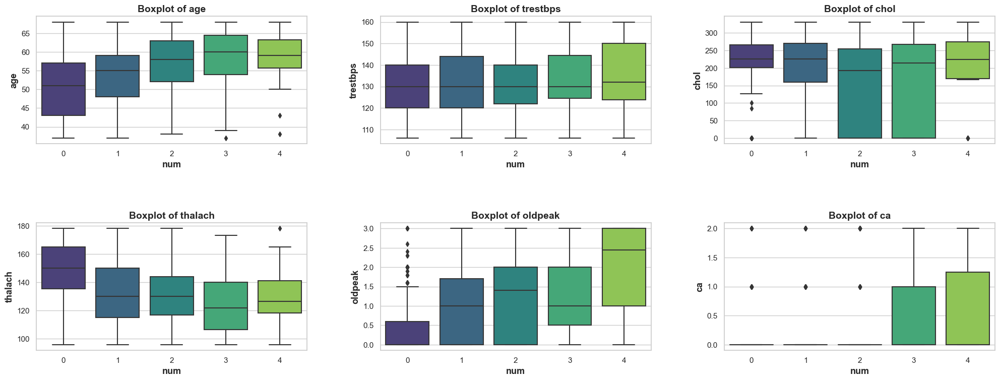

In [138]:
# Handling Outliers
# Define a function to winsorize outliers
def winsorize_outliers(df, limits):
    df_winsorized = df.copy()
    for col in df_winsorized.columns[:-1]:
        if pd.api.types.is_numeric_dtype(df_winsorized[col]):
            df_winsorized[col] = winsorize(df_winsorized[col], limits=limits)
    return df_winsorized

# Apply Winsorization with 5% limits
limits = [0.05, 0.05]  
Heart_df_winsorized = winsorize_outliers(Heart_df, limits)

# Set up the matplotlib figure for boxplots
plt.figure(figsize=(20, 40))

# Select numeric columns excluding the target variable
numeric_columns = Heart_df_winsorized.select_dtypes(include=[np.number]).columns[:-1]  
for i, col in enumerate(numeric_columns):
    plt.subplot(10, 3, i + 1) 
    sns.boxplot(x='num', y=col, data=Heart_df_winsorized, palette='viridis')
    plt.xlabel('num', fontsize=13, fontweight='bold')
    plt.ylabel(col, fontsize=13, fontweight='bold')
    plt.title(f'Boxplot of {col}', fontsize=14, fontweight='bold')
plt.tight_layout(w_pad=5, h_pad=5)
plt.show()


### Exploratory Data Analysis

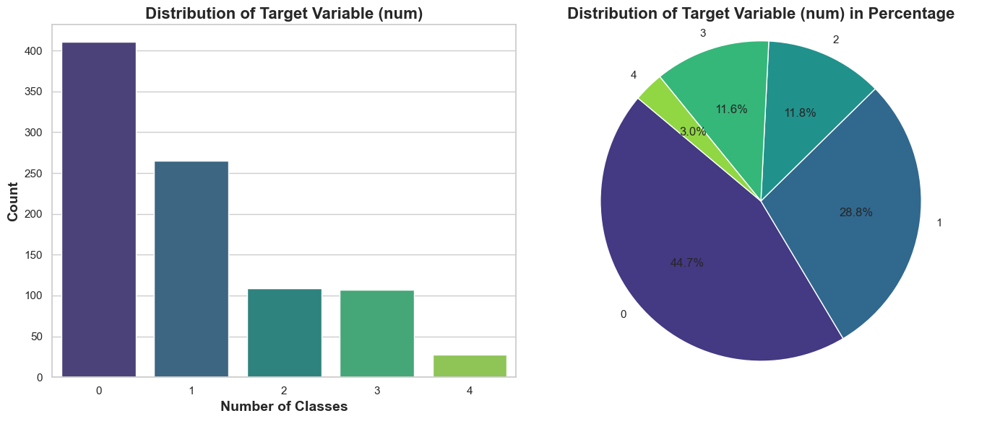

In [139]:
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)  
sns.countplot(data= Heart_df_winsorized, x='num', palette='viridis')
plt.title('Distribution of Target Variable (num)', fontsize=16, fontweight='bold')
plt.xlabel('Number of Classes', fontsize=14, fontweight='bold')
plt.ylabel('Count', fontsize=14, fontweight='bold')
num_counts =  Heart_df_winsorized['num'].value_counts()

plt.subplot(1, 2, 2) 
plt.pie(num_counts, labels=num_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('viridis', len(num_counts)))
plt.title('Distribution of Target Variable (num) in Percentage', fontsize=16, fontweight='bold')
plt.axis('equal')  


plt.tight_layout()
plt.show()


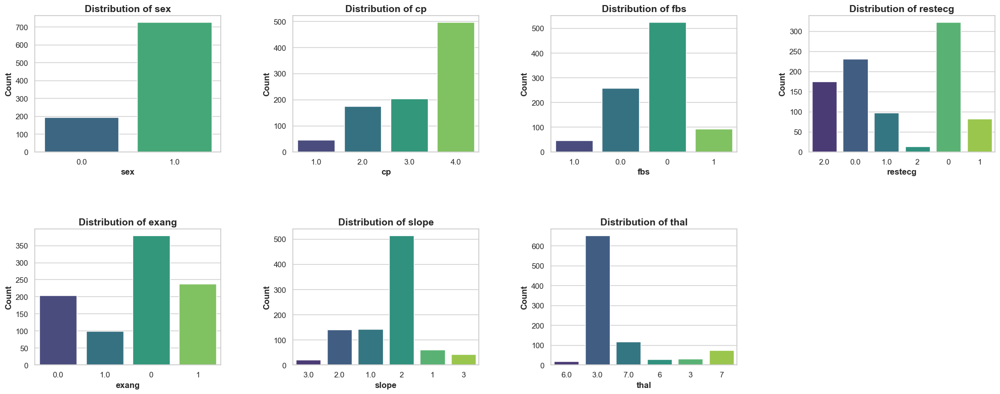

In [140]:
plt.figure(figsize=(20, 8))
categorical_vars = ['sex', 'cp', 'fbs', 'restecg', 'exang', 'slope', 'thal']

for i, col in enumerate(categorical_vars):
    plt.subplot(2, 4, i + 1)  
    sns.countplot(data=Heart_df_winsorized, x=col, palette='viridis')
    plt.title(f'Distribution of {col}', fontsize=14, fontweight='bold')
    plt.xlabel(col, fontsize=12, fontweight='bold')
    plt.ylabel('Count', fontsize=12, fontweight='bold')


plt.tight_layout(w_pad=5, h_pad=5)
plt.show()

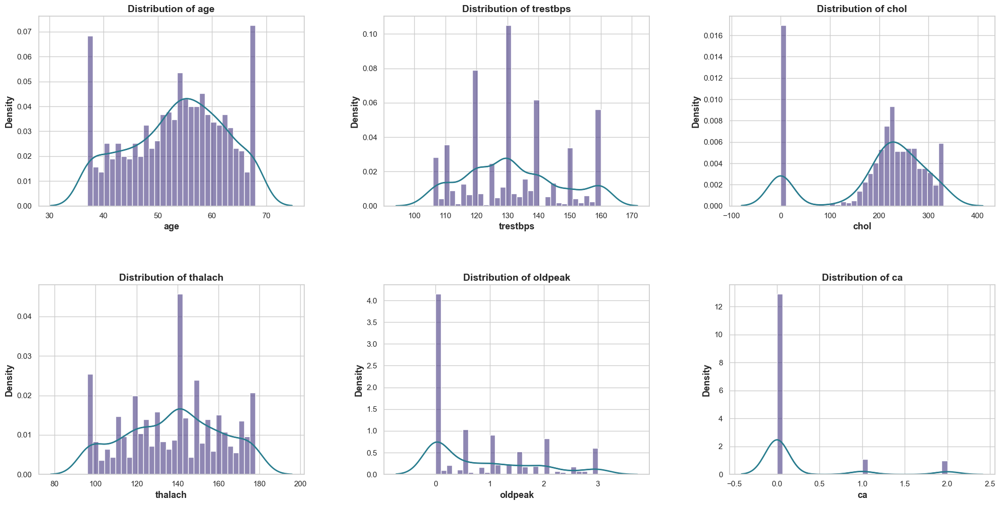

In [141]:
numeric_vars = Heart_df_winsorized.select_dtypes(include=['int64', 'float64']).columns
num_vars = len(numeric_vars)
plt.figure(figsize=(20, 5 * (num_vars // 3 + 1)))  

# Create a histogram  each numeric variable
for i, col in enumerate(numeric_vars):
    plt.subplot((num_vars // 3) + 1, 3, i + 1) 
    sns.histplot(Heart_df_winsorized[col], bins=30, color='#453781', kde=True, stat="density", alpha=0.6)
    sns.kdeplot(Heart_df_winsorized[col], color='#287D8E', linewidth=2)
    plt.xlabel(col, fontsize=13, fontweight='bold')
    plt.ylabel('Density', fontsize=13, fontweight='bold')
    plt.title(f'Distribution of {col}', fontsize=14, fontweight='bold')

plt.tight_layout(w_pad=5, h_pad=5)
plt.show()


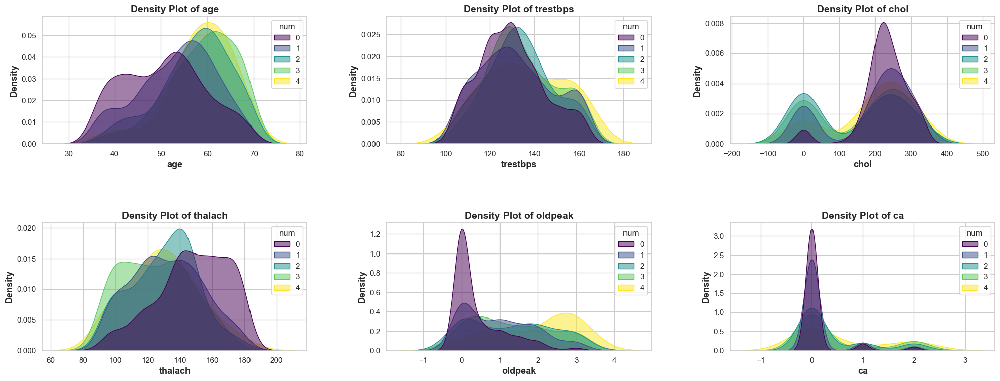

In [158]:
sns.set(style="whitegrid")
plt.figure(figsize=(20, 40))

numeric_vars = Heart_df_winsorized.select_dtypes(include=['int64', 'float64']).columns
if 'num' in numeric_vars:
    independent_vars = numeric_vars.drop('num')
else:
    independent_vars = numeric_vars

# Create a density plot for each numeric independent variable
for i, col in enumerate(independent_vars):
    plt.subplot(10, 3, i + 1)  
    sns.kdeplot(data=Heart_df_winsorized, x=col, hue='num', fill=True, palette='viridis', common_norm=False, alpha=0.5)
    
    # Add labels and title
    plt.xlabel(col, fontsize=13, fontweight='bold')
    plt.ylabel('Density', fontsize=13, fontweight='bold')
    plt.title(f'Density Plot of {col}', fontsize=14, fontweight='bold')

# Adjust the layout
plt.tight_layout(w_pad=5, h_pad=5)
plt.show()


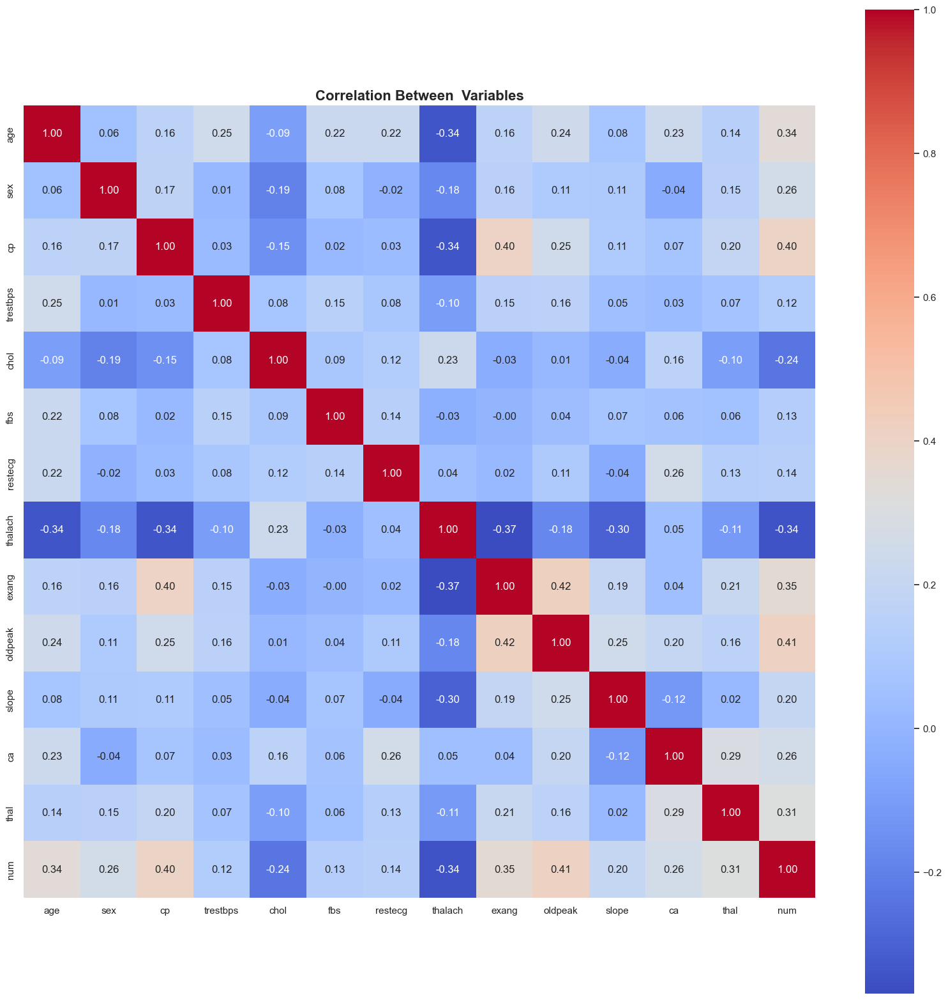

In [154]:
# Correlation B/W  Variables
correlation_matrix_heart = pd.DataFrame(Heart_df_winsorized, columns=Heart_df_winsorized.columns).corr()

# Set up the matplotlib figure
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix_heart, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title("Correlation Between  Variables", fontweight="bold", fontsize=16)
plt.show()

### Data Splitting Using Stratified Random Sampling

In [143]:
X_H = Heart_df_winsorized.drop('num', axis=1)  
y_H = Heart_df_winsorized['num'] 

# Perform stratified split
X_H_train, X_H_test, y_H_train, y_H_test = train_test_split(X_H, y_H, test_size=0.4, stratify=y_H, random_state=42)

# Display the shapes of the resulting datasets
print(f"Training data shape: {X_H_train.shape}, Training target shape: {y_H_train.shape}")
print(f"Testing data shape: {X_H_test.shape}, Testing target shape: {y_H_test.shape}")


Training data shape: (552, 13), Training target shape: (552,)
Testing data shape: (368, 13), Testing target shape: (368,)


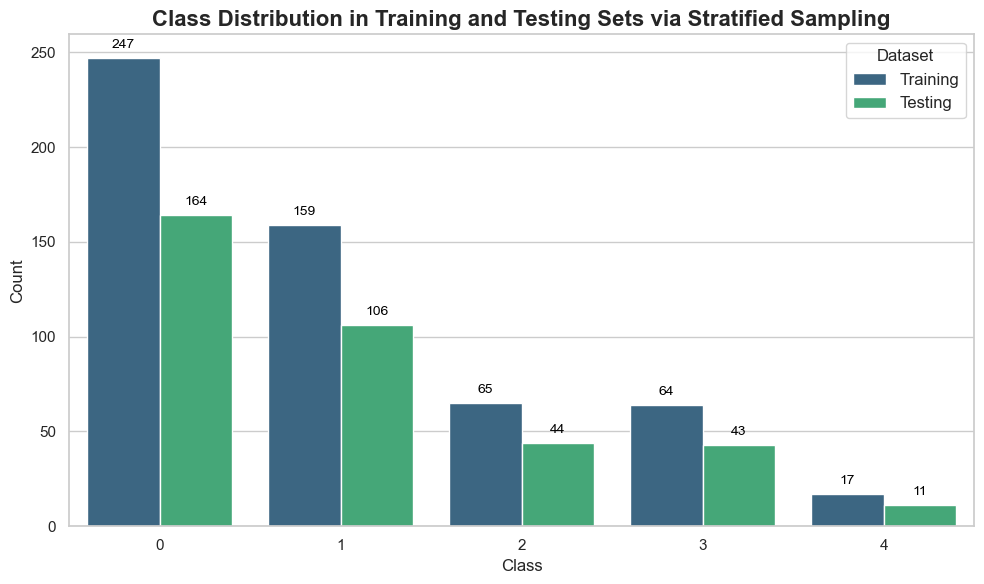

In [161]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Count the occurrences of each class in the training and testing sets
train_counts = y_H_train.value_counts()
test_counts = y_H_test.value_counts()

# Create a DataFrame for visualization
data = pd.DataFrame({
    'Class': train_counts.index.tolist() + test_counts.index.tolist(),
    'Count': train_counts.tolist() + test_counts.tolist(),
    'Set': ['Training'] * len(train_counts) + ['Testing'] * len(test_counts)
})

# Set the color palette
viridis_palette = sns.color_palette("viridis", len(data['Set'].unique()))

# Create the bar plot
plt.figure(figsize=(10, 6))
bar_plot = sns.barplot(x='Class', y='Count', hue='Set', data=data, palette=viridis_palette)

# Add titles and labels
plt.title('Class Distribution in Training and Testing Sets via Stratified Sampling', fontsize=16, fontweight='bold')
plt.xlabel('Class', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=0)
plt.legend(title='Dataset', fontsize=12)

# Annotate bars with their counts
for p in bar_plot.patches:
    bar_plot.annotate(format(int(p.get_height()), ','),
                      (p.get_x() + p.get_width() / 2., p.get_height()),
                      ha='center', va='bottom', fontsize=10,
                      color='black', xytext=(0, 5),  
                      textcoords='offset points')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


### Feature Scaling Using Standardization

In [144]:
# Standardization
scaler = StandardScaler()
X_H_train_scaled = scaler.fit_transform(X_H_train)
X_H_test_scaled = scaler.transform(X_H_test)

# Create DataFrames from the scaled data
X_H_train_scaled_df = pd.DataFrame(X_H_train_scaled, columns=X_H_train.columns)
X_H_test_scaled_df = pd.DataFrame(X_H_test_scaled, columns=X_H_test.columns)

# Reset the index for target variables
y_H_train_df = pd.Series(y_H_train).reset_index(drop=True)
y_H_test_df = pd.Series(y_H_test).reset_index(drop=True)

# Add the target variable to the scaled DataFrames
X_H_train_scaled_df['num'] = y_H_train_df
X_H_test_scaled_df['num'] = y_H_test_df

# Check the mean and standard deviation of the standardized training data:
print("Mean of each feature after standardization (Training data):")
print(X_H_train_scaled_df.drop('num', axis=1).mean())
print("\nStandard deviation of each feature after standardization (Training data):")
print(X_H_train_scaled_df.drop('num', axis=1).std())

# Check the mean and standard deviation of the standardized testing data:
print("\nMean of each feature after standardization (Testing data):")
print(X_H_test_scaled_df.drop('num', axis=1).mean())
print("\nStandard deviation of each feature after standardization (Testing data):")
print(X_H_test_scaled_df.drop('num', axis=1).std())

Mean of each feature after standardization (Training data):
age         2.413528e-17
sex         1.190674e-16
cp          2.059544e-16
trestbps    5.438484e-16
chol        1.061952e-16
fbs        -1.930823e-17
restecg    -4.505253e-17
thalach     9.010506e-17
exang      -5.792468e-17
oldpeak    -3.218038e-17
slope      -1.222854e-16
ca         -3.218038e-17
thal       -3.057136e-17
dtype: float64

Standard deviation of each feature after standardization (Training data):
age         1.000907
sex         1.000907
cp          1.000907
trestbps    1.000907
chol        1.000907
fbs         1.000907
restecg     1.000907
thalach     1.000907
exang       1.000907
oldpeak     1.000907
slope       1.000907
ca          1.000907
thal        1.000907
dtype: float64

Mean of each feature after standardization (Testing data):
age         0.064531
sex        -0.004447
cp          0.033652
trestbps    0.067324
chol        0.039897
fbs         0.103097
restecg     0.080243
thalach     0.010088
exang    

### Model Building And Evaluation

### 1.Random Forest

In [145]:
# Train the Random Forest model
rf_model_heart = RandomForestClassifier(random_state=42)
rf_model_heart.fit(X_H_train_scaled, y_H_train)

# Predictions
y_pred_rf_heart = rf_model_heart.predict(X_H_test_scaled)

# Metrics
accuracy_rf_heart = accuracy_score(y_H_test, y_pred_rf_heart)
precision_rf_heart = precision_score(y_H_test, y_pred_rf_heart, average='weighted')

# Confusion matrix
conf_matrix_rf_heart = confusion_matrix(y_H_test, y_pred_rf_heart)

# Calculate overall sensitivity and specificity
TP = np.diag(conf_matrix_rf_heart)  # True Positives are the diagonal elements
FN = conf_matrix_rf_heart.sum(axis=1) - TP  # False Negatives are row-wise sums minus TP
FP = conf_matrix_rf_heart.sum(axis=0) - TP  # False Positives are column-wise sums minus TP
TN = conf_matrix_rf_heart.sum() - (FP + FN + TP)  # True Negatives

# Overall sensitivity and specificity
sensitivity_rf_heart = TP.sum() / (TP.sum() + FN.sum())  # Sensitivity = TP / (TP + FN)
specificity_rf_heart = TN.sum() / (TN.sum() + FP.sum())  # Specificity = TN / (TN + FP)

# Print overall metrics
print("Overall Metrics:")
print(f"Accuracy: {accuracy_rf_heart:.2f}")
print(f"Precision (Weighted): {precision_rf_heart:.2f}")
print(f"Overall Sensitivity: {sensitivity_rf_heart:.2f}")
print(f"Overall Specificity: {specificity_rf_heart:.2f}")

# Print confusion matrix as a table
print("\nConfusion Matrix (Actual vs Predicted):")
confusion_df_heart = pd.DataFrame(conf_matrix_rf_heart, 
                                  index=[f'Actual {i}' for i in range(conf_matrix_rf_heart.shape[0])], 
                                  columns=[f'Predicted {i}' for i in range(conf_matrix_rf_heart.shape[1])])
print(confusion_df_heart)

# Print classification report for detailed metrics
print("\nClassification Report:")
print(classification_report(y_H_test, y_pred_rf_heart, target_names=[f'Class {i}' for i in range(conf_matrix_rf_heart.shape[0])]))


Overall Metrics:
Accuracy: 0.60
Precision (Weighted): 0.57
Overall Sensitivity: 0.60
Overall Specificity: 0.90

Confusion Matrix (Actual vs Predicted):
          Predicted 0  Predicted 1  Predicted 2  Predicted 3  Predicted 4
Actual 0          147           13            2            2            0
Actual 1           30           53           10           12            1
Actual 2            8           20            7            9            0
Actual 3            8           13            8           13            1
Actual 4            0            3            5            2            1

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.76      0.90      0.82       164
     Class 1       0.52      0.50      0.51       106
     Class 2       0.22      0.16      0.18        44
     Class 3       0.34      0.30      0.32        43
     Class 4       0.33      0.09      0.14        11

    accuracy                           0.60       368


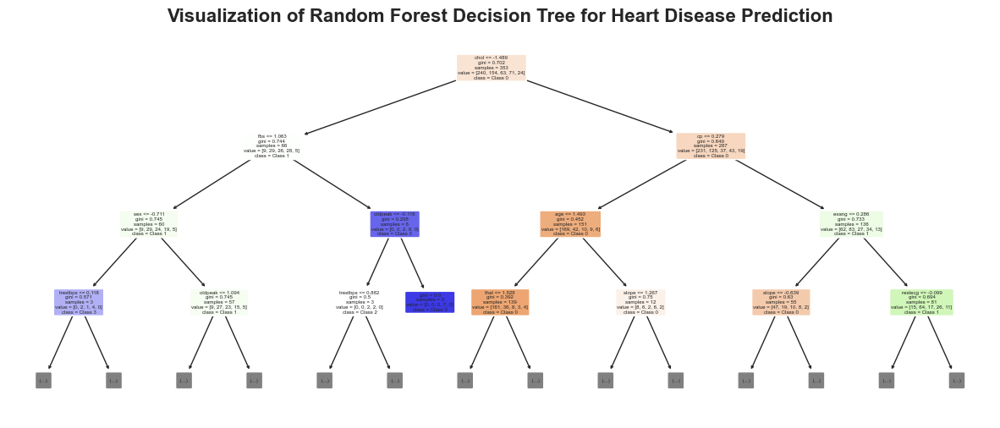

In [210]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

# Set up the figure for the tree visualization
plt.figure(figsize=(15, 6))

# Visualize a smaller portion of the first decision tree in the Random Forest model
plot_tree(rf_model_heart.estimators_[0], 
          feature_names=X_H_train.columns.tolist(),  
          class_names=[f'Class {i}' for i in range(len(set(y_H_train)))], 
          filled=True, 
          rounded=True,
          max_depth=3)  # Limit the depth of the tree for better visibility

# Set title for the plot
plt.title('Visualization of Random Forest Decision Tree for Heart Disease Prediction', fontsize=16, fontweight='bold')
plt.show()



### 2.Decision Tree

In [171]:
# Train the Decision Tree model
dt_model_heart = DecisionTreeClassifier(random_state=42)
dt_model_heart.fit(X_H_train_scaled, y_H_train)

# Predictions
y_pred_dt_heart = dt_model_heart.predict(X_H_test_scaled)

# Metrics
accuracy_dt_heart = accuracy_score(y_H_test, y_pred_dt_heart)
precision_dt_heart = precision_score(y_H_test, y_pred_dt_heart, average='weighted')

# Confusion matrix
conf_matrix_dt_heart = confusion_matrix(y_H_test, y_pred_dt_heart)

# Calculate overall sensitivity and specificity
TP_dt = np.diag(conf_matrix_dt_heart)  # True Positives from the diagonal
FN_dt = conf_matrix_dt_heart.sum(axis=1) - TP_dt  # False Negatives from row sums minus TP
FP_dt = conf_matrix_dt_heart.sum(axis=0) - TP_dt  # False Positives from column sums minus TP
TN_dt = conf_matrix_dt_heart.sum() - (FP_dt + FN_dt + TP_dt)  # True Negatives

# Overall Sensitivity and Specificity for Decision Tree
sensitivity_dt_heart = TP_dt.sum() / (TP_dt.sum() + FN_dt.sum())  # Sensitivity = TP / (TP + FN)
specificity_dt_heart = TN_dt.sum() / (TN_dt.sum() + FP_dt.sum())  # Specificity = TN / (TN + FP)

# Print overall metrics
print("Overall Metrics for Decision Tree Model:")
print(f"Accuracy: {accuracy_dt_heart:.2f}")
print(f"Precision (Weighted): {precision_dt_heart:.2f}")
print(f"Overall Sensitivity: {sensitivity_dt_heart:.2f}")
print(f"Overall Specificity: {specificity_dt_heart:.2f}")

# Print confusion matrix as a table
print("\nConfusion Matrix (Actual vs Predicted):")
confusion_df_dt_heart = pd.DataFrame(conf_matrix_dt_heart, 
                                     index=[f'Actual {i}' for i in range(conf_matrix_dt_heart.shape[0])], 
                                     columns=[f'Predicted {i}' for i in range(conf_matrix_dt_heart.shape[1])])
print(confusion_df_dt_heart)


print("\nClassification Report for Decision Tree:")
print(classification_report(y_H_test, y_pred_dt_heart, target_names=[f'Class {i}' for i in range(conf_matrix_dt_heart.shape[0])]))


Overall Metrics for Decision Tree Model:
Accuracy: 0.49
Precision (Weighted): 0.49
Overall Sensitivity: 0.49
Overall Specificity: 0.87

Confusion Matrix (Actual vs Predicted):
          Predicted 0  Predicted 1  Predicted 2  Predicted 3  Predicted 4
Actual 0          115           36            5            6            2
Actual 1           26           44           14           17            5
Actual 2            6           15           12            9            2
Actual 3           11           12           11            9            0
Actual 4            3            4            2            2            0

Classification Report for Decision Tree:
              precision    recall  f1-score   support

     Class 0       0.71      0.70      0.71       164
     Class 1       0.40      0.42      0.41       106
     Class 2       0.27      0.27      0.27        44
     Class 3       0.21      0.21      0.21        43
     Class 4       0.00      0.00      0.00        11

    accuracy

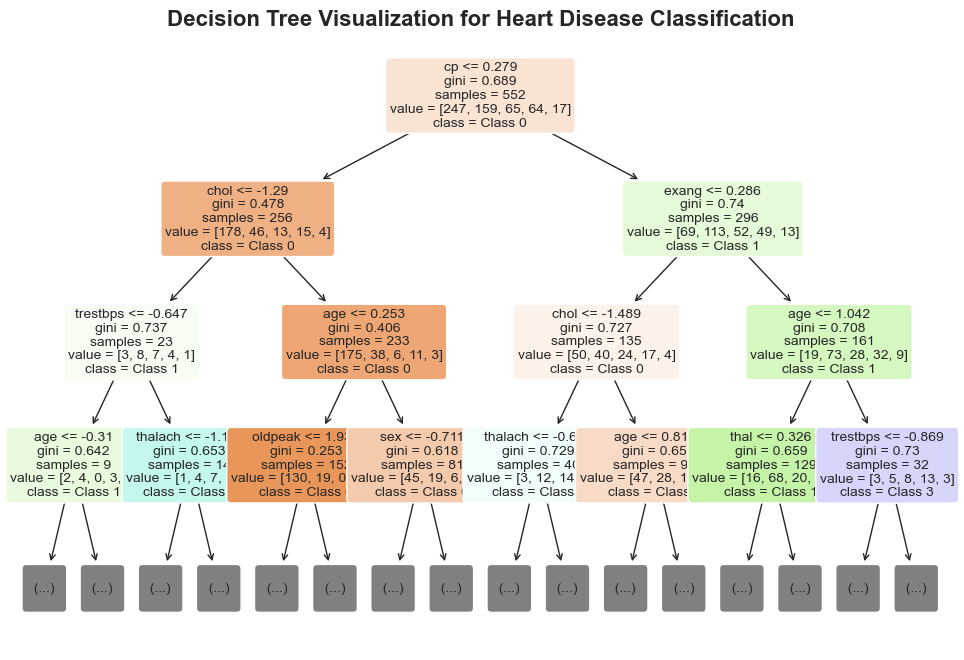

In [176]:
# Set a maximum depth for visualization
max_depth = 3  

# Plot the Decision Tree with limited depth
plt.figure(figsize=(12, 8))
plot_tree(dt_model_heart, 
          filled=True, 
          feature_names=X_H_train.columns.tolist(), 
          class_names=['Class 0', 'Class 1', 'Class 2', 'Class 3', 'Class 4'],  
          rounded=True, 
          fontsize=10,
          max_depth=max_depth) 

plt.title('Decision Tree Visualization for Heart Disease Classification', fontsize=16, fontweight='bold')
plt.show()


### 3.Support Vector Machine

In [147]:
# Train the SVM model
svm_model_heart = SVC(kernel='linear', random_state=42)
svm_model_heart.fit(X_H_train_scaled, y_H_train)

# Predictions
y_pred_svm_heart = svm_model_heart.predict(X_H_test_scaled)

# Metrics
accuracy_svm_heart = accuracy_score(y_H_test, y_pred_svm_heart)
precision_svm_heart = precision_score(y_H_test, y_pred_svm_heart, average='weighted')

# Confusion matrix
conf_matrix_svm_heart = confusion_matrix(y_H_test, y_pred_svm_heart)

# Calculate overall sensitivity and specificity
TP_svm = np.diag(conf_matrix_svm_heart)  # True Positives from diagonal
FN_svm = conf_matrix_svm_heart.sum(axis=1) - TP_svm  # False Negatives from row sums minus TP
FP_svm = conf_matrix_svm_heart.sum(axis=0) - TP_svm  # False Positives from column sums minus TP
TN_svm = conf_matrix_svm_heart.sum() - (FP_svm + FN_svm + TP_svm)  # True Negatives

# Overall Sensitivity and Specificity for SVM
sensitivity_svm_heart = TP_svm.sum() / (TP_svm.sum() + FN_svm.sum())  # Sensitivity = TP / (TP + FN)
specificity_svm_heart = TN_svm.sum() / (TN_svm.sum() + FP_svm.sum())  # Specificity = TN / (TN + FP)

# Print overall metrics
print("Overall Metrics for SVM Model:")
print(f"Accuracy: {accuracy_svm_heart:.2f}")
print(f"Precision (Weighted): {precision_svm_heart:.2f}")
print(f"Overall Sensitivity: {sensitivity_svm_heart:.2f}")
print(f"Overall Specificity: {specificity_svm_heart:.2f}")

# Print confusion matrix as a table
print("\nConfusion Matrix (Actual vs Predicted):")
confusion_df_svm_heart = pd.DataFrame(conf_matrix_svm_heart, 
                                      index=[f'Actual {i}' for i in range(conf_matrix_svm_heart.shape[0])], 
                                      columns=[f'Predicted {i}' for i in range(conf_matrix_svm_heart.shape[1])])
print(confusion_df_svm_heart)

print("\nClassification Report for SVM:")
print(classification_report(y_H_test, y_pred_svm_heart, target_names=[f'Class {i}' for i in range(conf_matrix_svm_heart.shape[0])]))


Overall Metrics for SVM Model:
Accuracy: 0.57
Precision (Weighted): 0.51
Overall Sensitivity: 0.57
Overall Specificity: 0.89

Confusion Matrix (Actual vs Predicted):
          Predicted 0  Predicted 1  Predicted 2  Predicted 3  Predicted 4
Actual 0          142           19            2            1            0
Actual 1           38           53            6            9            0
Actual 2           10           18            4           12            0
Actual 3            7           22            4           10            0
Actual 4            1            3            4            3            0

Classification Report for SVM:
              precision    recall  f1-score   support

     Class 0       0.72      0.87      0.78       164
     Class 1       0.46      0.50      0.48       106
     Class 2       0.20      0.09      0.13        44
     Class 3       0.29      0.23      0.26        43
     Class 4       0.00      0.00      0.00        11

    accuracy                    

C:\Users\likhi\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\likhi\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\likhi\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\likhi\anaconda3\Lib\site-packages\sklearn\metrics\_classifi

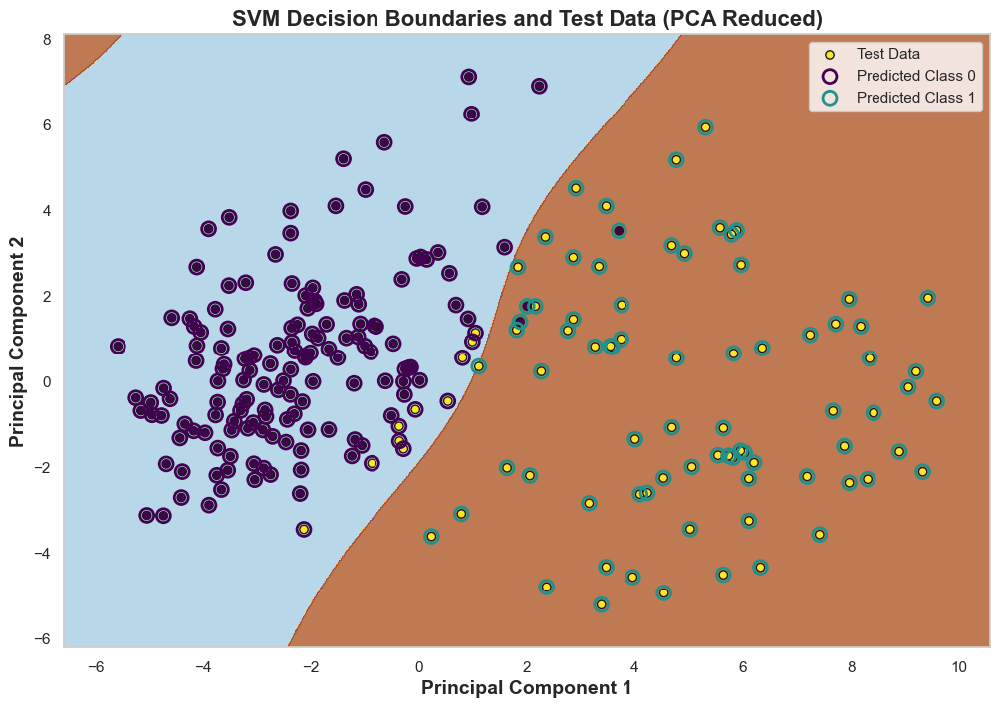

In [179]:
# Perform PCA to reduce dimensions to 2
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Train the SVM model on the PCA-transformed data
svm_model_pca = SVC()
svm_model_pca.fit(X_train_pca, y_train)

# Predict the class for the PCA-transformed test set
y_pred_svm_heart = svm_model_pca.predict(X_test_pca)

# Define the step size for the mesh grid
h = 0.02  
x_min, x_max = X_test_pca[:, 0].min() - 1, X_test_pca[:, 0].max() + 1
y_min, y_max = X_test_pca[:, 1].min() - 1, X_test_pca[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# Predict the class for each point in the mesh grid
Z = svm_model_pca.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Set up the plot
plt.figure(figsize=(12, 8))
plt.contourf(xx, yy, Z, alpha=0.8, cmap='Paired')

# Scatter plot of the test data
plt.scatter(X_test_pca[:, 0], X_test_pca[:, 1], c=y_test, edgecolors='k', marker='o', cmap='viridis', label='Test Data')

# Highlight predicted classes
unique_classes = np.unique(y_pred_svm_heart)  
for i in unique_classes:  
    plt.scatter(X_test_pca[y_pred_svm_heart == i, 0], 
                X_test_pca[y_pred_svm_heart == i, 1], 
                s=100, 
                facecolors='none', 
                edgecolors=plt.cm.viridis(i / len(unique_classes)),  
                label=f'Predicted Class {i}', 
                linewidth=2)

# Title and labels
plt.title('SVM Decision Boundaries and Test Data (PCA Reduced)', fontsize=16, fontweight='bold')
plt.xlabel('Principal Component 1', fontsize=14, fontweight='bold')
plt.ylabel('Principal Component 2', fontsize=14, fontweight='bold')
plt.legend()
plt.grid()
plt.show()


### 4.K-Nearest Neighbors (KNN)

In [148]:
# Train the KNN model
knn_model_heart = KNeighborsClassifier(n_neighbors=5)  
knn_model_heart.fit(X_H_train_scaled, y_H_train)

# Predictions
y_pred_knn_heart = knn_model_heart.predict(X_H_test_scaled)

# Metrics
accuracy_knn_heart = accuracy_score(y_H_test, y_pred_knn_heart)
precision_knn_heart = precision_score(y_H_test, y_pred_knn_heart, average='weighted')

# Confusion matrix
conf_matrix_knn_heart = confusion_matrix(y_H_test, y_pred_knn_heart)

# Calculate overall sensitivity and specificity
TP_knn = np.diag(conf_matrix_knn_heart)  # True Positives from diagonal
FN_knn = conf_matrix_knn_heart.sum(axis=1) - TP_knn  # False Negatives from row sums minus TP
FP_knn = conf_matrix_knn_heart.sum(axis=0) - TP_knn  # False Positives from column sums minus TP
TN_knn = conf_matrix_knn_heart.sum() - (FP_knn + FN_knn + TP_knn)  # True Negatives

# Overall Sensitivity and Specificity for KNN
sensitivity_knn_heart = TP_knn.sum() / (TP_knn.sum() + FN_knn.sum())  # Sensitivity = TP / (TP + FN)
specificity_knn_heart = TN_knn.sum() / (TN_knn.sum() + FP_knn.sum())  # Specificity = TN / (TN + FP)

# Print overall metrics
print("Overall Metrics for KNN Model:")
print(f"Accuracy: {accuracy_knn_heart:.2f}")
print(f"Precision (Weighted): {precision_knn_heart:.2f}")
print(f"Overall Sensitivity: {sensitivity_knn_heart:.2f}")
print(f"Overall Specificity: {specificity_knn_heart:.2f}")

# Print confusion matrix as a table
print("\nConfusion Matrix (Actual vs Predicted):")
confusion_df_knn_heart = pd.DataFrame(conf_matrix_knn_heart, 
                                       index=[f'Actual {i}' for i in range(conf_matrix_knn_heart.shape[0])], 
                                       columns=[f'Predicted {i}' for i in range(conf_matrix_knn_heart.shape[1])])
print(confusion_df_knn_heart)

# Print classification report for detailed metrics
print("\nClassification Report for KNN:")
print(classification_report(y_H_test, y_pred_knn_heart, target_names=[f'Class {i}' for i in range(conf_matrix_knn_heart.shape[0])]))


Overall Metrics for KNN Model:
Accuracy: 0.58
Precision (Weighted): 0.54
Overall Sensitivity: 0.58
Overall Specificity: 0.89

Confusion Matrix (Actual vs Predicted):
          Predicted 0  Predicted 1  Predicted 2  Predicted 3  Predicted 4
Actual 0          141           17            4            2            0
Actual 1           28           56           12           10            0
Actual 2           11           16            8            7            2
Actual 3           11           13           10            7            2
Actual 4            1            2            5            3            0

Classification Report for KNN:
              precision    recall  f1-score   support

     Class 0       0.73      0.86      0.79       164
     Class 1       0.54      0.53      0.53       106
     Class 2       0.21      0.18      0.19        44
     Class 3       0.24      0.16      0.19        43
     Class 4       0.00      0.00      0.00        11

    accuracy                    

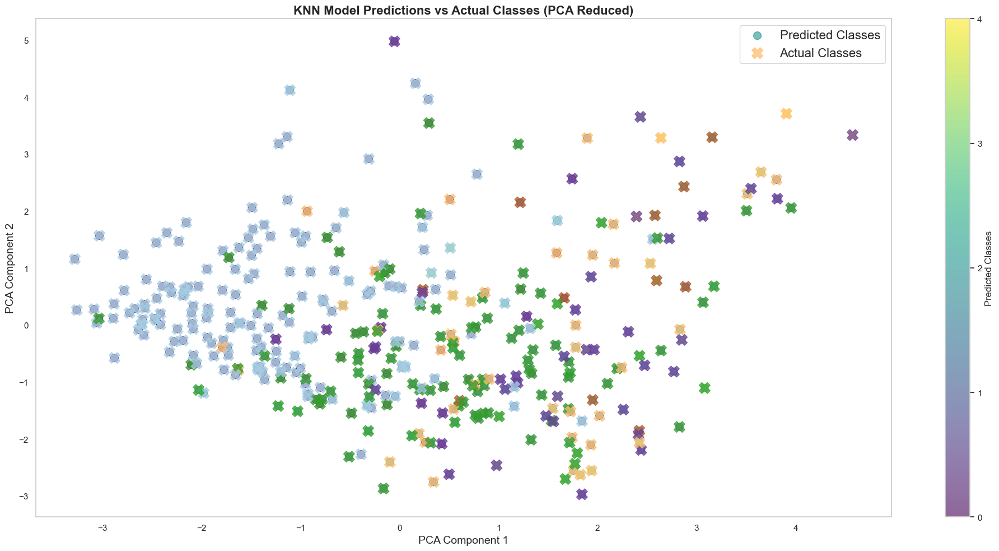

In [199]:
# Perform PCA to reduce dimensions to 2 for visualization
pca = PCA(n_components=2)
X_H_test_pca = pca.fit_transform(X_H_test_scaled)

# Create a scatter plot
plt.figure(figsize=(20, 10))
# Scatter plot for predicted classes
predicted_scatter = plt.scatter(X_H_test_pca[:, 0], X_H_test_pca[:, 1], 
                                 c=y_pred_knn_heart, cmap='viridis', 
                                 s=100, alpha=0.6, label='Predicted Classes')

# Adding a color bar
plt.colorbar(predicted_scatter, ticks=range(len(set(y_H_test))), label='Predicted Classes')

# Overlay scatter plot for actual classes
actual_scatter = plt.scatter(X_H_test_pca[:, 0], X_H_test_pca[:, 1], 
                              c=y_H_test, marker='X', cmap='Paired', 
                              s=200, label='Actual Classes', alpha=0.75)

# Labels and title
plt.title('KNN Model Predictions vs Actual Classes (PCA Reduced)', fontsize=16, fontweight='bold')
plt.xlabel('PCA Component 1', fontsize=14)
plt.ylabel('PCA Component 2', fontsize=14)

# Adding a legend
plt.legend(fontsize=16)
plt.grid()

# Show plot
plt.tight_layout()
plt.show()


### 5.Gradient Boositng Classifier

In [149]:
# Train the Gradient Boosting model
gb_model_heart = GradientBoostingClassifier(random_state=42)
gb_model_heart.fit(X_H_train_scaled, y_H_train)

# Predictions
y_pred_gb_heart = gb_model_heart.predict(X_H_test_scaled)

# Metrics
accuracy_gb_heart = accuracy_score(y_H_test, y_pred_gb_heart)
precision_gb_heart = precision_score(y_H_test, y_pred_gb_heart, average='weighted')

# Confusion matrix
conf_matrix_gb_heart = confusion_matrix(y_H_test, y_pred_gb_heart)

# Calculate overall sensitivity and specificity
TP_gb = np.diag(conf_matrix_gb_heart)  # True Positives from diagonal
FN_gb = conf_matrix_gb_heart.sum(axis=1) - TP_gb  # False Negatives from row sums minus TP
FP_gb = conf_matrix_gb_heart.sum(axis=0) - TP_gb  # False Positives from column sums minus TP
TN_gb = conf_matrix_gb_heart.sum() - (FP_gb + FN_gb + TP_gb)  # True Negatives

# Overall Sensitivity and Specificity for Gradient Boosting
sensitivity_gb_heart = TP_gb.sum() / (TP_gb.sum() + FN_gb.sum())  # Sensitivity = TP / (TP + FN)
specificity_gb_heart = TN_gb.sum() / (TN_gb.sum() + FP_gb.sum())  # Specificity = TN / (TN + FP)

# Print overall metrics
print("Overall Metrics for Gradient Boosting Model:")
print(f"Accuracy: {accuracy_gb_heart:.2f}")
print(f"Precision (Weighted): {precision_gb_heart:.2f}")
print(f"Overall Sensitivity: {sensitivity_gb_heart:.2f}")
print(f"Overall Specificity: {specificity_gb_heart:.2f}")

# Print confusion matrix as a table
print("\nConfusion Matrix (Actual vs Predicted):")
confusion_df_gb_heart = pd.DataFrame(conf_matrix_gb_heart, 
                                       index=[f'Actual {i}' for i in range(conf_matrix_gb_heart.shape[0])], 
                                       columns=[f'Predicted {i}' for i in range(conf_matrix_gb_heart.shape[1])])
print(confusion_df_gb_heart)

# Print classification report for detailed metrics
print("\nClassification Report for Gradient Boosting:")
print(classification_report(y_H_test, y_pred_gb_heart, target_names=[f'Class {i}' for i in range(conf_matrix_gb_heart.shape[0])]))

Overall Metrics for Gradient Boosting Model:
Accuracy: 0.60
Precision (Weighted): 0.58
Overall Sensitivity: 0.60
Overall Specificity: 0.90

Confusion Matrix (Actual vs Predicted):
          Predicted 0  Predicted 1  Predicted 2  Predicted 3  Predicted 4
Actual 0          139           17            3            4            1
Actual 1           31           55           12            7            1
Actual 2            4           19           11            6            4
Actual 3            5           16            5           16            1
Actual 4            1            2            5            3            0

Classification Report for Gradient Boosting:
              precision    recall  f1-score   support

     Class 0       0.77      0.85      0.81       164
     Class 1       0.50      0.52      0.51       106
     Class 2       0.31      0.25      0.28        44
     Class 3       0.44      0.37      0.41        43
     Class 4       0.00      0.00      0.00        11

    

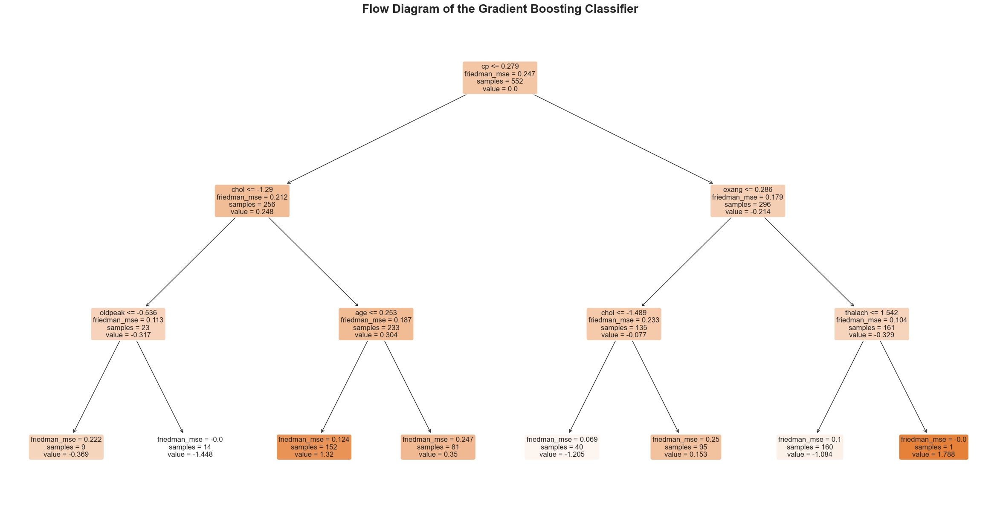

In [202]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

# Get the first tree from the trained Gradient Boosting model
tree_to_plot = gb_model_heart.estimators_[0, 0]

# Set a larger figure size for better visibility
plt.figure(figsize=(30, 15))

# Create a list of feature names
feature_names_list = list(X_H_train.columns)  # Adjust this if your features are in a different format

# Plot the tree with enhanced text sizes
plot_tree(tree_to_plot, 
          feature_names=feature_names_list, 
          class_names=[f'Class {i}' for i in range(5)],  # Class labels from 0 to 4
          filled=True, 
          rounded=True,
          fontsize=12)  # Increase font size for better readability

# Title for the plot
plt.title("Flow Diagram of the Gradient Boosting Classifier", fontsize=20, fontweight='bold')

# Show the plot
plt.show()




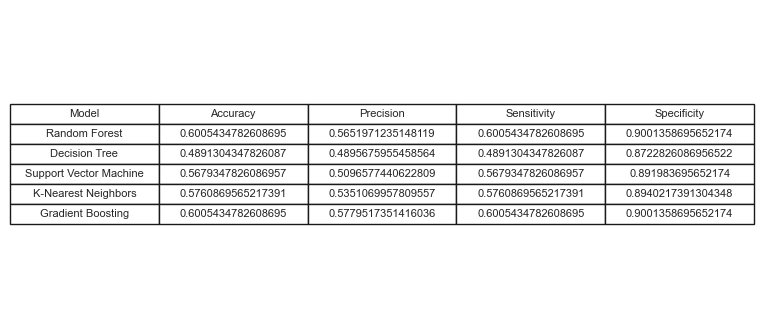

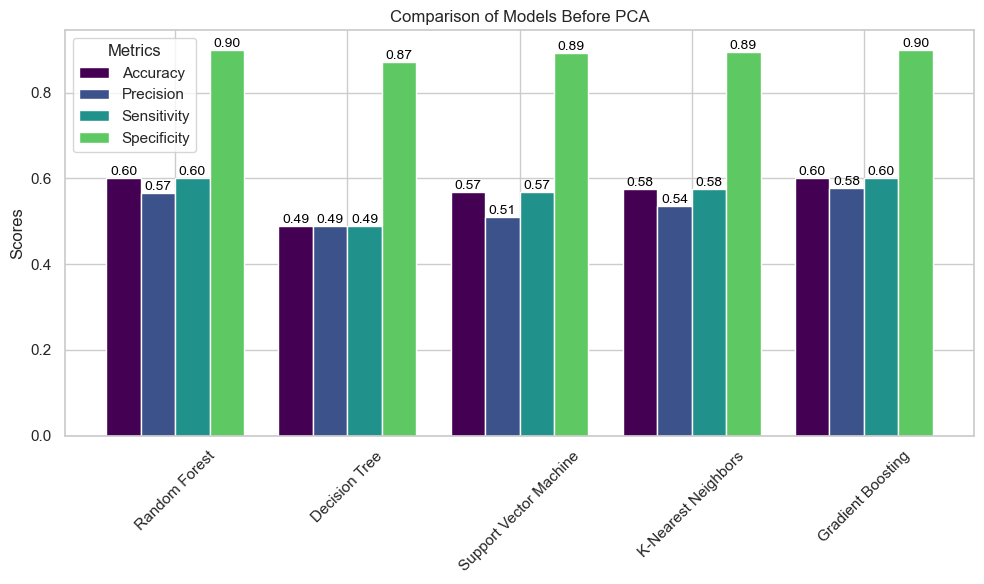

In [205]:
# Define a dictionary to hold the metrics for each model
metrics_dict = {
    "Model": ["Random Forest", "Decision Tree", "Support Vector Machine", "K-Nearest Neighbors", "Gradient Boosting"],
    "Accuracy": [accuracy_rf_heart, accuracy_dt_heart, accuracy_svm_heart, accuracy_knn_heart, accuracy_gb_heart],
    "Precision": [precision_rf_heart, precision_dt_heart, precision_svm_heart, precision_knn_heart, precision_gb_heart],
    "Sensitivity": [sensitivity_rf_heart, sensitivity_dt_heart, sensitivity_svm_heart, sensitivity_knn_heart, sensitivity_gb_heart],
    "Specificity": [specificity_rf_heart, specificity_dt_heart, specificity_svm_heart, specificity_knn_heart, specificity_gb_heart]
}

# Create a DataFrame from the dictionary
comparison_df = pd.DataFrame(metrics_dict)

# Create a figure and axis for the table
fig, ax = plt.subplots(figsize=(8, 4))  

# Hide axes for the table
ax.axis('tight')
ax.axis('off')

# Create a table
table = ax.table(cellText=comparison_df.values, colLabels=comparison_df.columns, cellLoc='center', loc='center')

# Set table properties
table.auto_set_font_size(False)
table.set_fontsize(8)
table.scale(1.2, 1.2)  

# Show the table
plt.show()

import numpy as np
import matplotlib.pyplot as plt

# Create a bar plot for model comparison
metrics = ['Accuracy', 'Precision', 'Sensitivity', 'Specificity']
bar_width = 0.2
x = np.arange(len(comparison_df['Model']))

# Create a figure and axis for the bar plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot each metric as a bar and add annotations
for i, metric in enumerate(metrics):
    bars = ax.bar(x + i * bar_width, comparison_df[metric], width=bar_width, label=metric, color=plt.cm.viridis(i / len(metrics)))

    # Annotate each bar with its height
    for bar in bars:
        yval = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, yval, f'{yval:.2f}', ha='center', va='bottom', fontsize=10, color='black')

# Set the x-ticks, labels, and title
ax.set_xticks(x + bar_width * (len(metrics) - 1) / 2)
ax.set_xticklabels(comparison_df['Model'], rotation=45)
ax.set_ylabel('Scores')
ax.set_title('Comparison of Models Before PCA')
ax.legend(title='Metrics')

# Show the bar plot
plt.tight_layout()
plt.show()



### Dimensionality Reduction and Model Evaluation with PCA

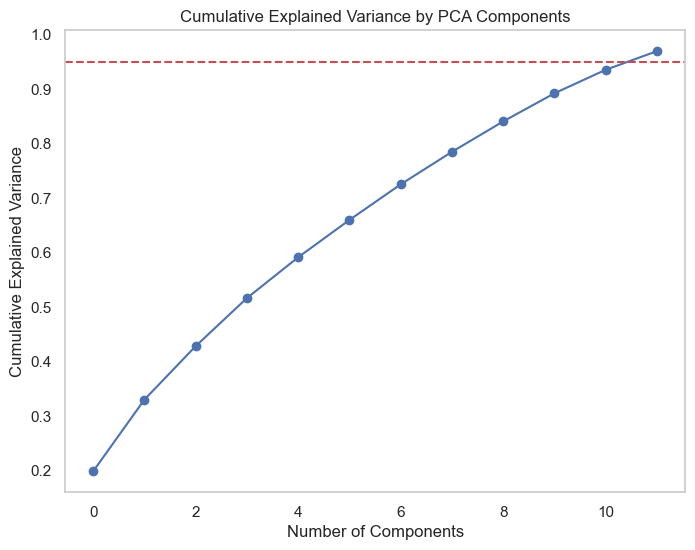

Explained variance ratio for each component: [0.19870173 0.13143735 0.09804991 0.08817169 0.07482273 0.06843517
 0.0652937  0.05965948 0.05578256 0.05158359 0.0431476  0.03416314]
Cumulative explained variance: [0.19870173 0.33013908 0.42818899 0.51636068 0.5911834  0.65961858
 0.72491227 0.78457175 0.84035431 0.8919379  0.9350855  0.96924863]


In [206]:
# Apply PCA to the scaled data, retaining enough components for 95% explained variance
pca = PCA(n_components=0.95)
X_H_train_pca = pca.fit_transform(X_H_train_scaled)
X_H_test_pca = pca.transform(X_H_test_scaled)

# Cumulative explained variance plot
plt.figure(figsize=(8, 6))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o', color='b')
plt.title('Cumulative Explained Variance by PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid()
plt.axhline(y=0.95, color='r', linestyle='--')  # Line at 95% variance
plt.annotate('95% Variance', xy=(len(np.cumsum(pca.explained_variance_ratio_)), 0.95), 
             xytext=(len(np.cumsum(pca.explained_variance_ratio_)) - 5, 0.9),
             arrowprops=dict(facecolor='black', shrink=0.05))
plt.show()

# Explained variance ratio for each component
print(f'Explained variance ratio for each component: {pca.explained_variance_ratio_}')
print(f'Cumulative explained variance: {np.cumsum(pca.explained_variance_ratio_)}')


In [207]:
models = {
    "Random Forest": RandomForestClassifier(),
    "Decision Tree": DecisionTreeClassifier(),
    "Support Vector Machine": SVC(probability=True),
    "K-Nearest Neighbors": KNeighborsClassifier(),
    "Gradient Boosting": GradientBoostingClassifier()
}

# Evaluate each model
for name, model in models.items():
    # Train the model
    model.fit(X_H_train_pca, y_H_train)
    
    # Predictions
    y_pred = model.predict(X_H_test_pca)
    
    # Calculate metrics
    accuracy = accuracy_score(y_H_test, y_pred)
    precision = precision_score(y_H_test, y_pred, average='weighted')  
    sensitivity = recall_score(y_H_test, y_pred, average='weighted')  
    specificity = recall_score(y_H_test, y_pred, average='macro', pos_label=0)  

    # Print metrics
    print(f"Model: {name}")
    print(f"Accuracy: {accuracy:.2f}")
    print(f"Precision: {precision:.2f}")
    print(f"Sensitivity: {sensitivity:.2f}")
    print(f"Specificity: {specificity:.2f}") 

    # Print confusion matrix as a table
    conf_matrix = confusion_matrix(y_H_test, y_pred)
    conf_matrix_df = pd.DataFrame(conf_matrix, 
                                   index=["Actual 0", "Actual 1", "Actual 2", "Actual 3", "Actual 4"], 
                                   columns=["Predicted 0", "Predicted 1", "Predicted 2", "Predicted 3", "Predicted 4"])
    print("\nConfusion Matrix:")
    print(conf_matrix_df)

    # Print classification report
    print("\nClassification Report:")
    print(classification_report(y_H_test, y_pred, target_names=["Class 0", "Class 1", "Class 2", "Class 3", "Class 4"]))
    
    print("=" * 50)



C:\Users\likhi\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1521: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
C:\Users\likhi\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1521: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
C:\Users\likhi\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\likhi\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1521: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'ma

Model: Random Forest
Accuracy: 0.55
Precision: 0.53
Sensitivity: 0.55
Specificity: 0.35

Confusion Matrix:
          Predicted 0  Predicted 1  Predicted 2  Predicted 3  Predicted 4
Actual 0          136           20            4            4            0
Actual 1           33           49            7           16            1
Actual 2            5           17            9           12            1
Actual 3            7           12           11           10            3
Actual 4            0            3            5            3            0

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.75      0.83      0.79       164
     Class 1       0.49      0.46      0.47       106
     Class 2       0.25      0.20      0.23        44
     Class 3       0.22      0.23      0.23        43
     Class 4       0.00      0.00      0.00        11

    accuracy                           0.55       368
   macro avg       0.34      0.35      0.34  

C:\Users\likhi\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1521: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


Model: K-Nearest Neighbors
Accuracy: 0.58
Precision: 0.54
Sensitivity: 0.58
Specificity: 0.35

Confusion Matrix:
          Predicted 0  Predicted 1  Predicted 2  Predicted 3  Predicted 4
Actual 0          142           18            3            1            0
Actual 1           28           57           10           11            0
Actual 2            9           18            9            6            2
Actual 3           13           12           10            6            2
Actual 4            0            3            5            3            0

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.74      0.87      0.80       164
     Class 1       0.53      0.54      0.53       106
     Class 2       0.24      0.20      0.22        44
     Class 3       0.22      0.14      0.17        43
     Class 4       0.00      0.00      0.00        11

    accuracy                           0.58       368
   macro avg       0.35      0.35      

C:\Users\likhi\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1521: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(



The evaluation of various machine learning models following PCA reveals distinct performance characteristics across each model. The Support Vector Machine (SVM) emerged as the most effective classifier, achieving an accuracy of 61%, with commendable precision and sensitivity values, particularly for Class 0. In contrast, the Decision Tree model exhibited the lowest accuracy at 50%, highlighting its limitations in handling this specific dataset. The Random Forest and Gradient Boosting models demonstrated comparable performances, both with an accuracy of 55%, while K-Nearest Neighbors (KNN) slightly trailed with 58%. Notably, classes 2, 3, and 4 generally displayed lower precision and recall metrics across all models, indicating challenges in correctly classifying these categories. Overall, the SVM's superior performance suggests its robustness in this context, warranting further exploration for potential improvements in classifying the less accurately predicted classes.

C:\Users\likhi\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1521: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
C:\Users\likhi\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1521: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
C:\Users\likhi\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\likhi\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1521: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'ma

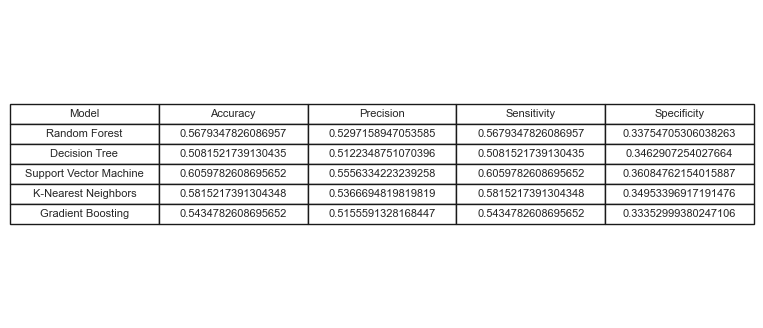

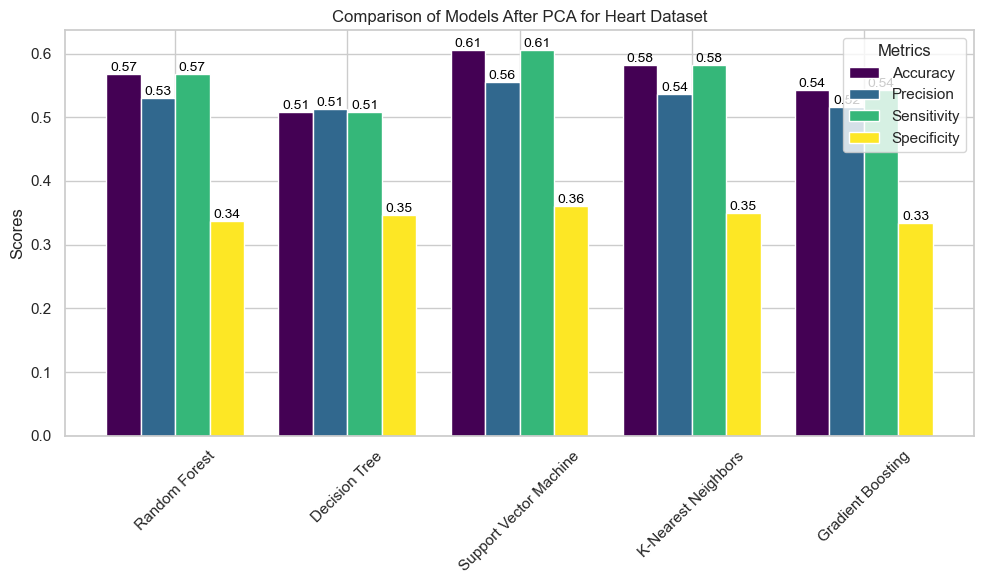

In [208]:
# Initialize lists to store metrics for each model
model_names = []
accuracies = []
precisions = []
sensitivities = []
specificities = []

# Evaluate each model
for name, model in models.items():
    # Train the model
    model.fit(X_H_train_pca, y_H_train)
    
    # Predictions
    y_pred = model.predict(X_H_test_pca)
    
    # Calculate metrics
    accuracy = accuracy_score(y_H_test, y_pred)
    precision = precision_score(y_H_test, y_pred, average='weighted')  
    sensitivity = recall_score(y_H_test, y_pred, average='weighted')  
    specificity = recall_score(y_H_test, y_pred, average='macro', pos_label=0)  

    # Append metrics to lists
    model_names.append(name)
    accuracies.append(accuracy)
    precisions.append(precision)
    sensitivities.append(sensitivity)
    specificities.append(specificity)

# Create a DataFrame to hold the metrics
metrics_df = pd.DataFrame({
    "Model": model_names,
    "Accuracy": accuracies,
    "Precision": precisions,
    "Sensitivity": sensitivities,
    "Specificity": specificities
})

# 1. Create a comparison table with no colors
fig, ax = plt.subplots(figsize=(8, 4))  # Adjust the size as needed
ax.axis('tight')
ax.axis('off')

# Create a table
table = ax.table(cellText=metrics_df.values, colLabels=metrics_df.columns, cellLoc='center', loc='center')

# Set table properties
table.auto_set_font_size(False)
table.set_fontsize(8)
table.scale(1.2, 1.2)  

# Show the table
plt.show()

import numpy as np
import matplotlib.pyplot as plt

# Assuming metrics_df is already defined and contains model comparison metrics
metrics = ['Accuracy', 'Precision', 'Sensitivity', 'Specificity']
bar_width = 0.2
x = np.arange(len(metrics_df['Model']))

# Create a figure and axis for the bar plot
fig, ax = plt.subplots(figsize=(10, 6))

# Define Viridis colormap
colors = plt.cm.viridis(np.linspace(0, 1, len(metrics)))

# Plot each metric as a bar with Viridis colors
for i, metric in enumerate(metrics):
    bars = ax.bar(x + i * bar_width, metrics_df[metric], width=bar_width, label=metric, color=colors[i])
    
    # Annotate each bar with the metric value
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.2f}', 
                ha='center', va='bottom', fontsize=10, color='black')  

# Set the x-ticks, labels, and title
ax.set_xticks(x + bar_width * (len(metrics) - 1) / 2)
ax.set_xticklabels(metrics_df['Model'], rotation=45)
ax.set_ylabel('Scores')
ax.set_title('Comparison of Models After PCA for Heart Dataset')
ax.legend(title='Metrics')

# Show the bar plot
plt.tight_layout()
plt.show()



### Conclusion